In [104]:
import sys
sys.path.append('/project/FoolingDetection/pytorch')

import importlib
import lib.VisualizationProvider
import lib.FeatureProvider
import lib.StaticMetricProvider
importlib.reload(lib.VisualizationProvider)
importlib.reload(lib.FeatureProvider)
importlib.reload(lib.StaticMetricProvider)

from lib.VisualizationProvider import (plot_2d_distributions, 
                                       plot_2d_distributions2,
                                       plot_scatter, 
                                       plot_scatter2, 
                                       plot_gaussian_distributions,
                                       plot_heatmap,
                                       plot_comparison_heatmaps
                                      )

from lib.FeatureProvider import (load_all_grids, 
                                 load_all_grids_randparams,
                                 reduce_dimensionality_umap, 
                                 reduce_dimensionality_kpca, 
                                 reduce_dimensionality_tsne
                                )

from lib.StaticMetricProvider import (test_all_introspection_technique_combinations, 
                                      calc_distributions, 
                                      get_values_from_distance_matrix, 
                                      difference_distances, 
                                      apply_log_to_distances,
                                      calculate_stats
                                     )
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import KernelPCA

# Base Code 

In [2]:
MODEL_TYPE = "cnn"
DATASET = "mnist"
ATTACK1 = "correct"
ATTACK2 = "RandLabels"
ATTACK3 = "RandParams/Cascading/20_Conv2d"
MAX_IMAGES = 300
RANDOM_STATE = 42
NUMBER_COMPONENTS = 2

In [3]:
all_grids_1 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK1, 
    max_images=MAX_IMAGES
)
all_grids_2 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK2, 
    max_images=MAX_IMAGES
)

all_grids_3 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK3, 
    max_images=MAX_IMAGES
)

distances_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_2, techniques1, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_3, techniques2, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_NoAttacked_RandLabels = difference_distances(
    reference=distances_1, 
    delta=distances_2, 
    fold_change_and_log_scale=True
)

difference_NoAttacked_RandParams = difference_distances(
    reference=distances_1, 
    delta=distances_3, 
    fold_change_and_log_scale=True
)

Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 o

In [4]:
# UMap Reducer Object
umap_reducer = UMAP(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE)


# UMap Transform
all_grids_1_umap = reduce_dimensionality_umap(all_grids_1, umap_reducer)
all_grids_2_umap = reduce_dimensionality_umap(all_grids_2, umap_reducer)
all_grids_3_umap = reduce_dimensionality_umap(all_grids_3, umap_reducer)


distances_umap_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_umap_NoAttacked_RandLabels = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_2, 
    fold_change_and_log_scale=True
)

difference_umap_NoAttacked_RandParams = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [5]:
# TSNE Reducer Object
tsne_reducer = TSNE(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE, n_jobs=-1)


# TSNE Transform
all_grids_1_tsne =reduce_dimensionality_tsne(all_grids_1, tsne_reducer)
all_grids_2_tsne =reduce_dimensionality_tsne(all_grids_2, tsne_reducer)
all_grids_3_tsne =reduce_dimensionality_tsne(all_grids_3, tsne_reducer)

distances_tsne_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_tsne_NoAttacked_RandLabels = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_2, 
    fold_change_and_log_scale=True
)

difference_tsne_NoAttacked_RandParams = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...


In [6]:
# kPCA Transform
# kPCA-Linear Reducer Object
kpca_linear_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="linear", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

# Linear kernel
all_grids_1_kpca_linear = reduce_dimensionality_kpca(all_grids_1, kpca_linear_reducer)
all_grids_2_kpca_linear = reduce_dimensionality_kpca(all_grids_2, kpca_linear_reducer)
all_grids_3_kpca_linear = reduce_dimensionality_kpca(all_grids_3, kpca_linear_reducer)

distances_kcpa_linear_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_linear_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_2, 
    fold_change_and_log_scale=True
)

difference_kpca_linear_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_3, 
    fold_change_and_log_scale=True
)

# Poly kernel

# kPCA-Poly Reducer Object
kpca_poly_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="poly", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_poly = reduce_dimensionality_kpca(all_grids_1, kpca_poly_reducer)
all_grids_2_kpca_poly = reduce_dimensionality_kpca(all_grids_2, kpca_poly_reducer)
all_grids_3_kpca_poly = reduce_dimensionality_kpca(all_grids_3, kpca_poly_reducer)

distances_kcpa_poly_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_poly_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_2, 
    fold_change_and_log_scale=True
)

difference_kpca_poly_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_3, 
    fold_change_and_log_scale=True
)

# Cosine kernel
# kPCA-Cosine Reducer Object
kpca_cosine_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="cosine", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_cosine = reduce_dimensionality_kpca(all_grids_1, kpca_cosine_reducer)
all_grids_2_kpca_cosine = reduce_dimensionality_kpca(all_grids_2, kpca_cosine_reducer)
all_grids_3_kpca_cosine = reduce_dimensionality_kpca(all_grids_3, kpca_cosine_reducer)

distances_kcpa_cosine_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_cosine_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_2, 
    fold_change_and_log_scale=True
)

difference_kpca_cosine_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimension

# Lower-Dimensional Comparison (Aggregated)
Map the unattacked and an attacked version to a lower_dim space (n=2) and see how the distributions in this lower-dim space differ!

## Normal (Left) vs. RandLabels (Middle) vs. RandParams (Right)

### UMap

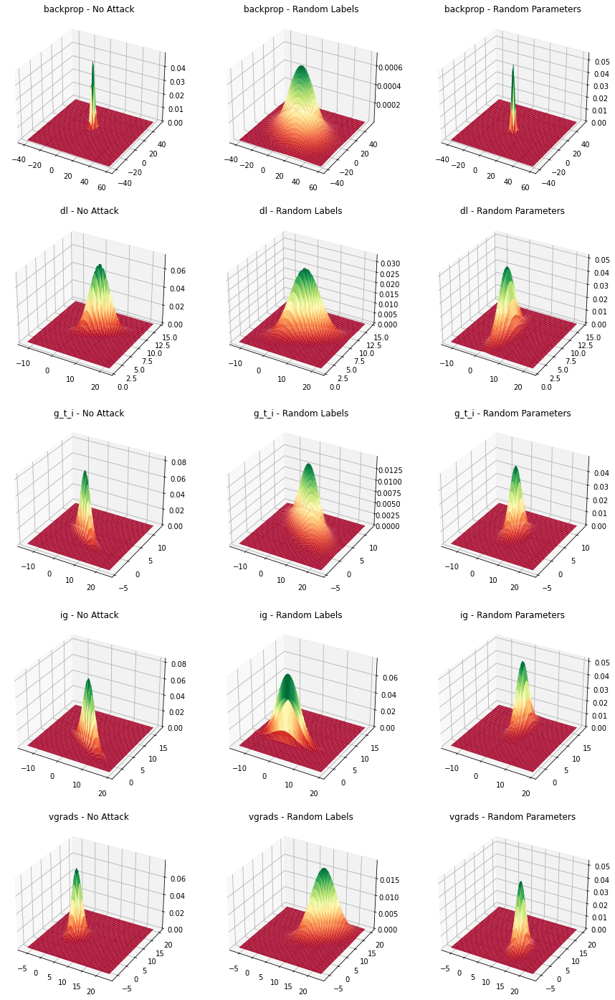

In [157]:
plot_2d_distributions2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

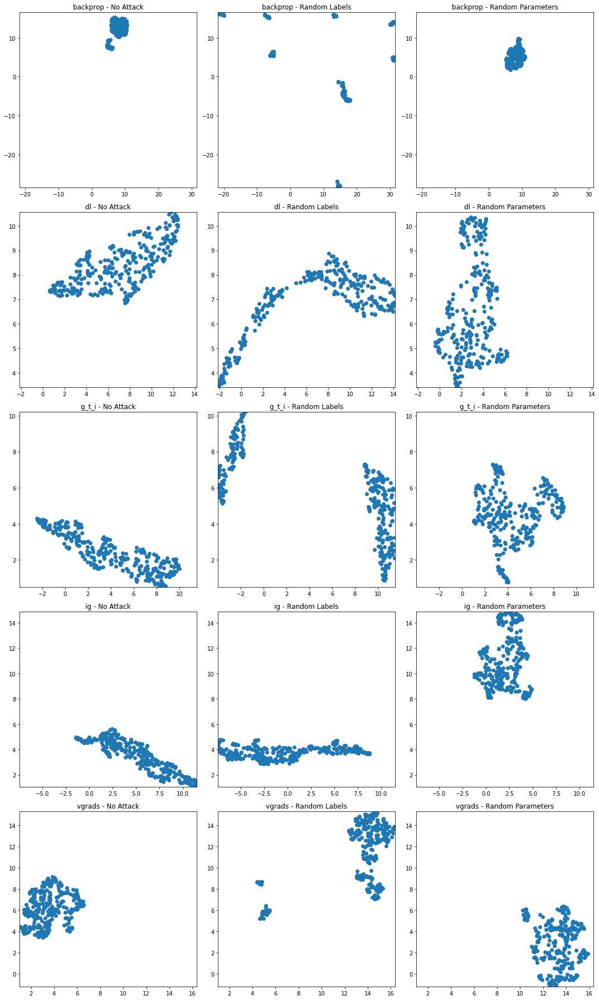

In [158]:
plot_scatter2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [159]:
calculate_stats(all_grids_1_umap, all_grids_2_umap,  all_grids_3_umap)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,7.675658,1.689461,12.271533,2.180716
1,backprop,Grids 2,10.330824,16.217621,1.876520,14.199161
2,backprop,Grids 3,8.044076,1.559615,5.090187,1.957723
3,dl,Grids 1,7.074432,3.384224,8.416562,0.911874
4,dl,Grids 2,6.717315,5.094820,6.820007,1.306971
5,dl,Grids 3,2.942827,1.578730,6.525724,1.977257
6,g_t_i,Grids 1,3.956589,3.600756,2.407322,1.039241
7,g_t_i,Grids 2,5.446043,6.384573,5.602949,2.307351
8,g_t_i,Grids 3,4.468055,2.174443,4.464119,1.468764
9,ig,Grids 1,5.199458,3.489075,3.448847,1.262952


### kPCA (Linear)

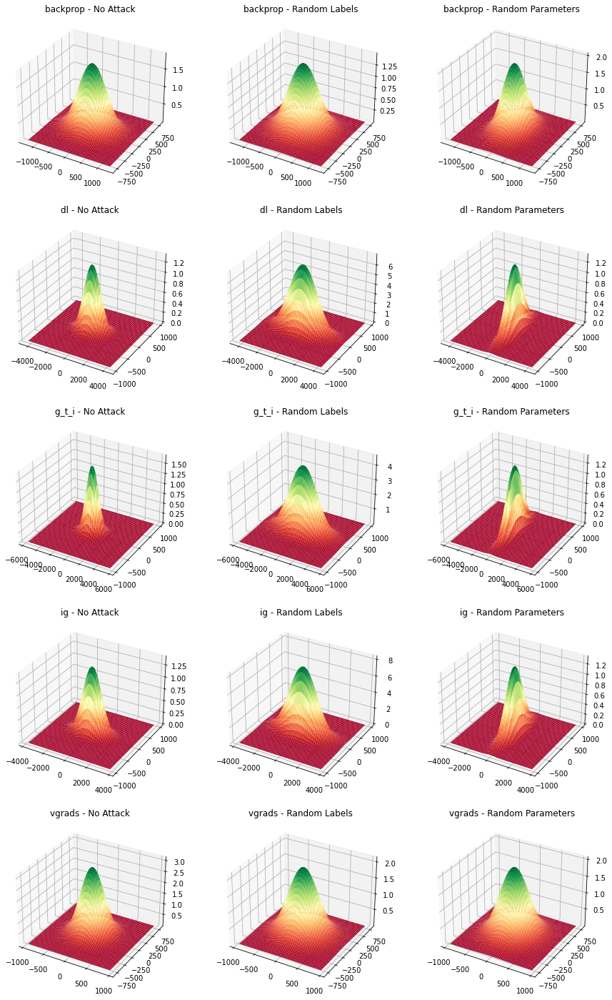

In [160]:
plot_2d_distributions2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

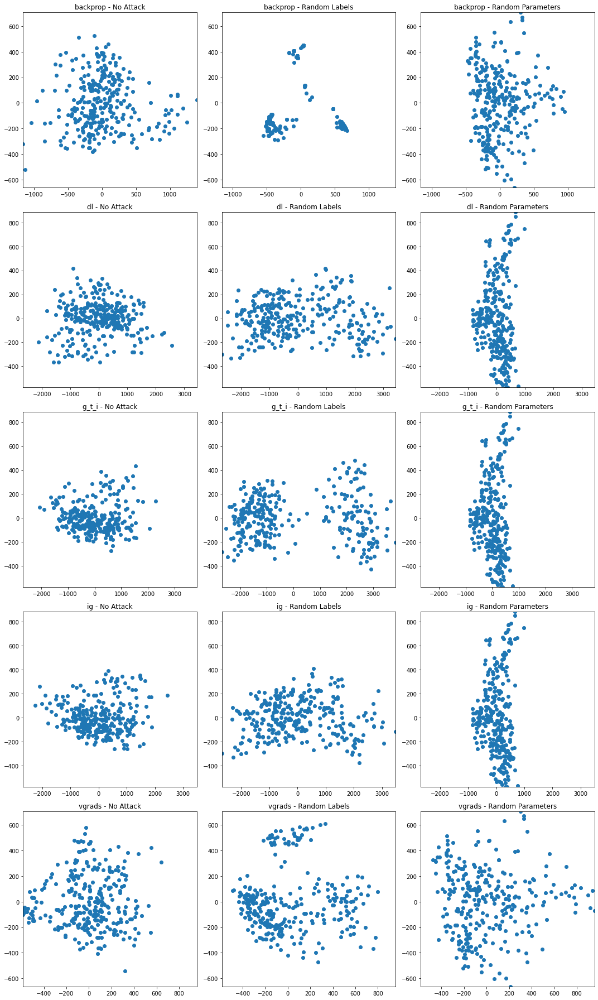

In [161]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [162]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-3.334814e-14,403.817959,1.136868e-13,205.979204
1,backprop,Grids 2,-4.244309e-14,421.764733,-3.031649e-15,254.652729
2,backprop,Grids 3,2.576902e-14,300.446449,-6.063298e-15,259.416636
3,dl,Grids 1,9.094947e-15,828.322174,-4.206413e-14,144.334580
4,dl,Grids 2,1.212660e-14,1450.241378,3.243864e-13,156.698007
5,dl,Grids 3,6.063298e-15,366.963730,-6.063298e-15,324.928746
6,g_t_i,Grids 1,1.818989e-14,782.088022,-1.856885e-14,121.521710
7,g_t_i,Grids 2,-3.031649e-14,1892.172294,-4.869586e-13,182.661551
8,g_t_i,Grids 3,-9.094947e-15,366.963726,-7.579123e-15,324.928705
9,ig,Grids 1,-5.911716e-14,829.641864,-1.164343e-13,136.082140


### kPCA (poly)

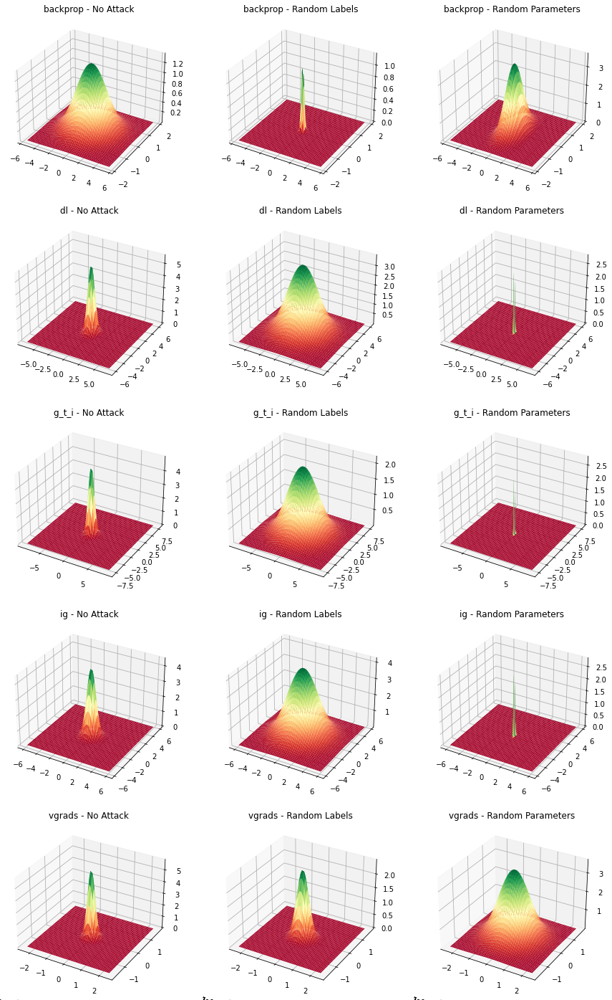

In [163]:
plot_2d_distributions2(all_grids_1_kpca_poly, all_grids_2_kpca_poly, all_grids_3_kpca_poly, title1="No Attack", title2="Random Labels", title3="Random Parameters")

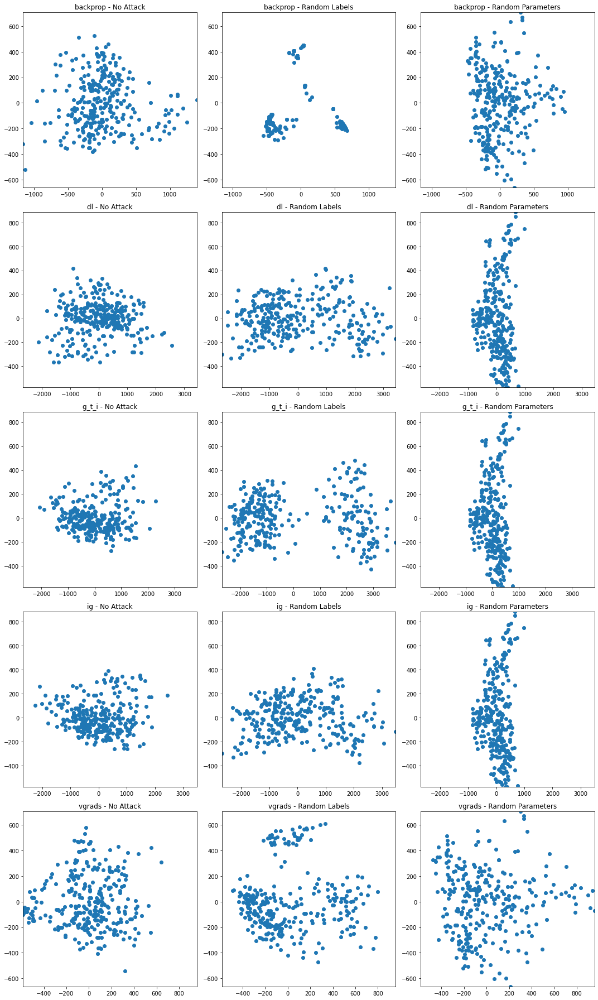

In [164]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [165]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-3.334814e-14,403.817959,1.136868e-13,205.979204
1,backprop,Grids 2,-4.244309e-14,421.764733,-3.031649e-15,254.652729
2,backprop,Grids 3,2.576902e-14,300.446449,-6.063298e-15,259.416636
3,dl,Grids 1,9.094947e-15,828.322174,-4.206413e-14,144.334580
4,dl,Grids 2,1.212660e-14,1450.241378,3.243864e-13,156.698007
5,dl,Grids 3,6.063298e-15,366.963730,-6.063298e-15,324.928746
6,g_t_i,Grids 1,1.818989e-14,782.088022,-1.856885e-14,121.521710
7,g_t_i,Grids 2,-3.031649e-14,1892.172294,-4.869586e-13,182.661551
8,g_t_i,Grids 3,-9.094947e-15,366.963726,-7.579123e-15,324.928705
9,ig,Grids 1,-5.911716e-14,829.641864,-1.164343e-13,136.082140


### kPCA (cosine)

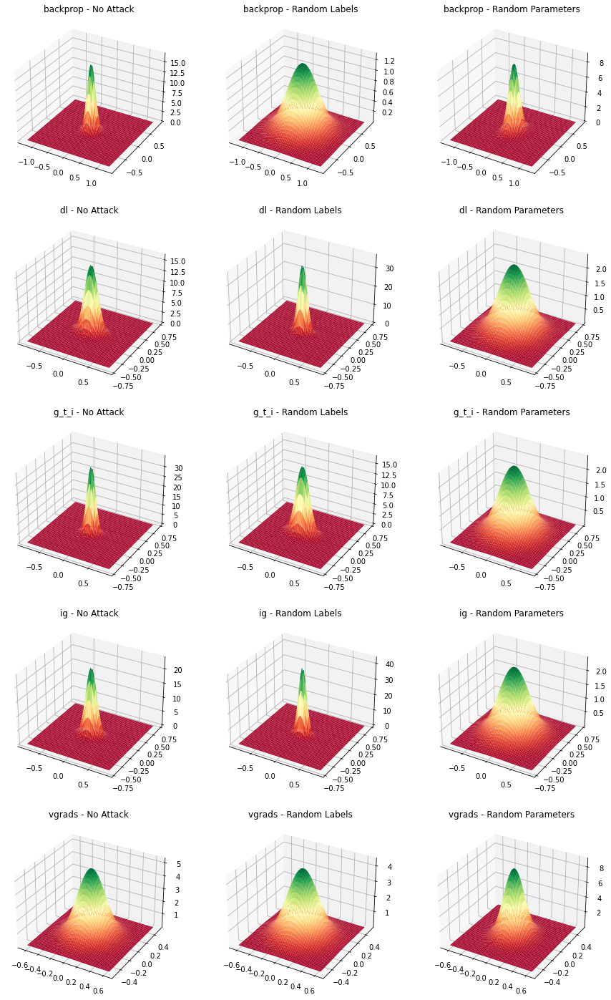

In [166]:
plot_2d_distributions2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

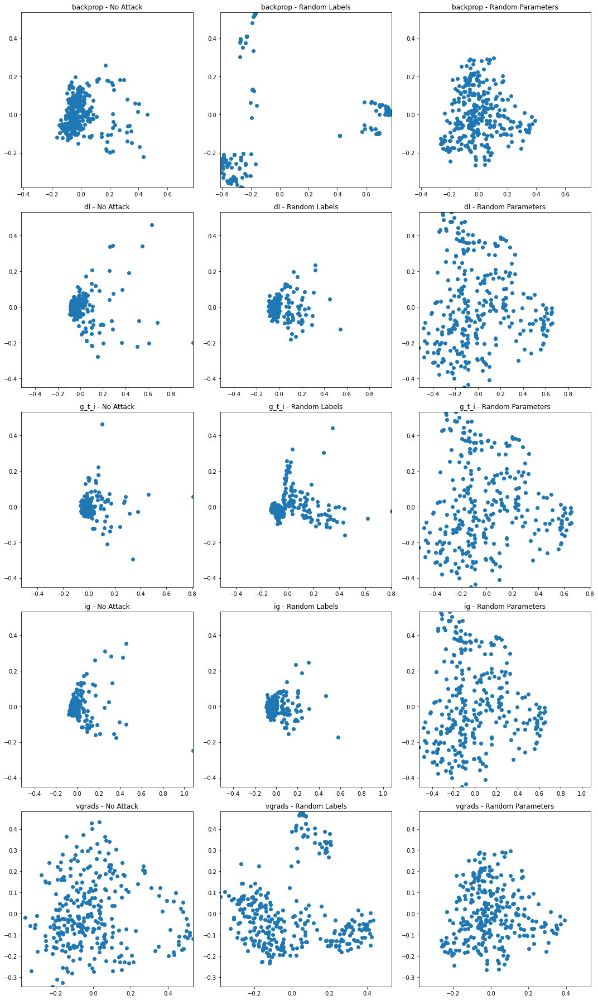

In [167]:
plot_scatter2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [168]:
calculate_stats(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,4.100424e-16,0.113434,-2.150132e-16,0.083554
1,backprop,Grids 2,4.736952e-17,0.421900,1.184238e-16,0.290125
2,backprop,Grids 3,1.058413e-16,0.136693,1.509903e-16,0.129403
3,dl,Grids 1,-2.327768e-16,0.131065,3.826569e-16,0.075836
4,dl,Grids 2,-2.771857e-16,0.089671,2.090920e-16,0.048992
5,dl,Grids 3,-2.368476e-17,0.280527,-8.955799e-17,0.232331
6,g_t_i,Grids 1,-2.633079e-16,0.084921,9.618232e-16,0.053631
7,g_t_i,Grids 2,2.361074e-16,0.135870,1.380377e-16,0.070554
8,g_t_i,Grids 3,-1.776357e-17,0.280527,-1.080617e-16,0.232331
9,ig,Grids 1,8.844777e-17,0.106948,-3.550863e-16,0.062875


### t-SNE

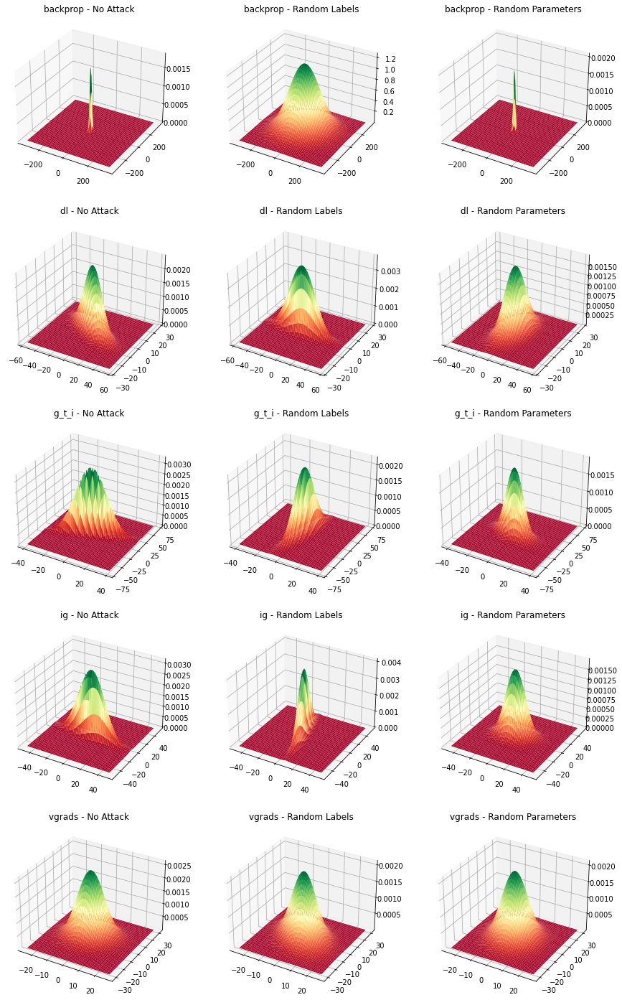

In [169]:
# (this execution works but takes ages...)
plot_2d_distributions2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

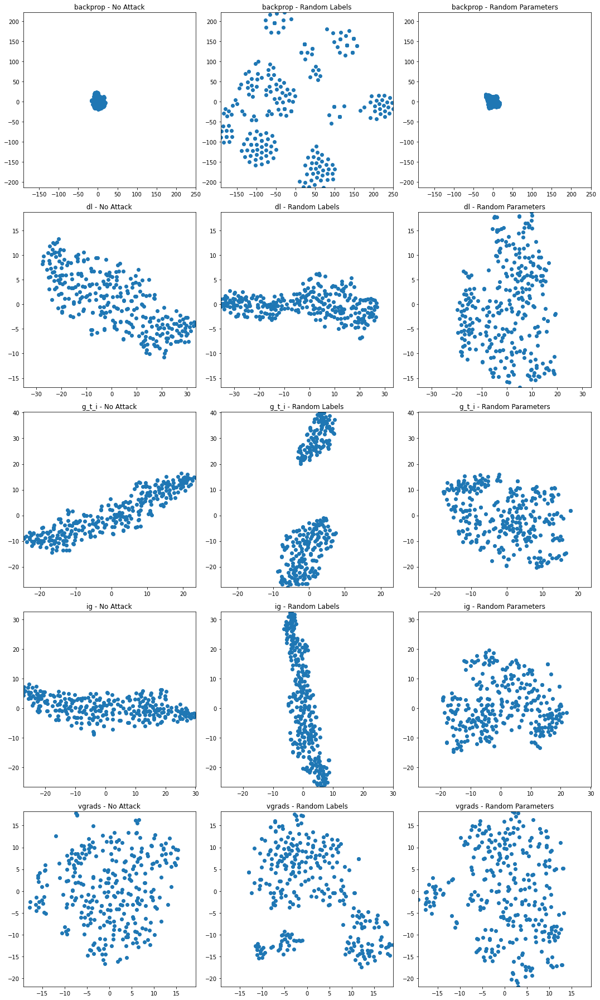

In [170]:
plot_scatter2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [171]:
calculate_stats(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,0.707629,8.429726,0.273925,10.440837
1,backprop,Grids 2,11.943088,109.654785,4.646422,116.065544
2,backprop,Grids 3,-1.162515,9.439001,0.702128,8.632077
3,dl,Grids 1,1.254747,16.783400,0.638639,5.658719
4,dl,Grids 2,-1.732750,18.348171,-0.134264,2.331952
5,dl,Grids 3,0.083229,10.319683,-0.504581,8.935125
6,g_t_i,Grids 1,-0.252266,13.240751,0.454748,8.178529
7,g_t_i,Grids 2,0.060975,3.819221,2.135317,22.654179
8,g_t_i,Grids 3,-0.362733,9.202917,-0.557347,9.508883
9,ig,Grids 1,0.644136,16.028400,0.266824,3.366182


# Per-Image Comparison 
For a combination of two Explanation Techniques (expl1, expl2) (e.g. expl1=DeepLift, expl2=vanillaGrads) compute the distance for each image in a **Lower and High Dimensional Space**. Finally, plot the distributions. 

This is also done for the difference of the distances. For this the distances for an attacked and non-attacked versions are calculated and then the difference is calculated using the fold_change on a logarithmic scale. Finally, this is plotted aswell.

In [172]:
METRIC="euclidean"

## High-Dimensional 

### No Attack

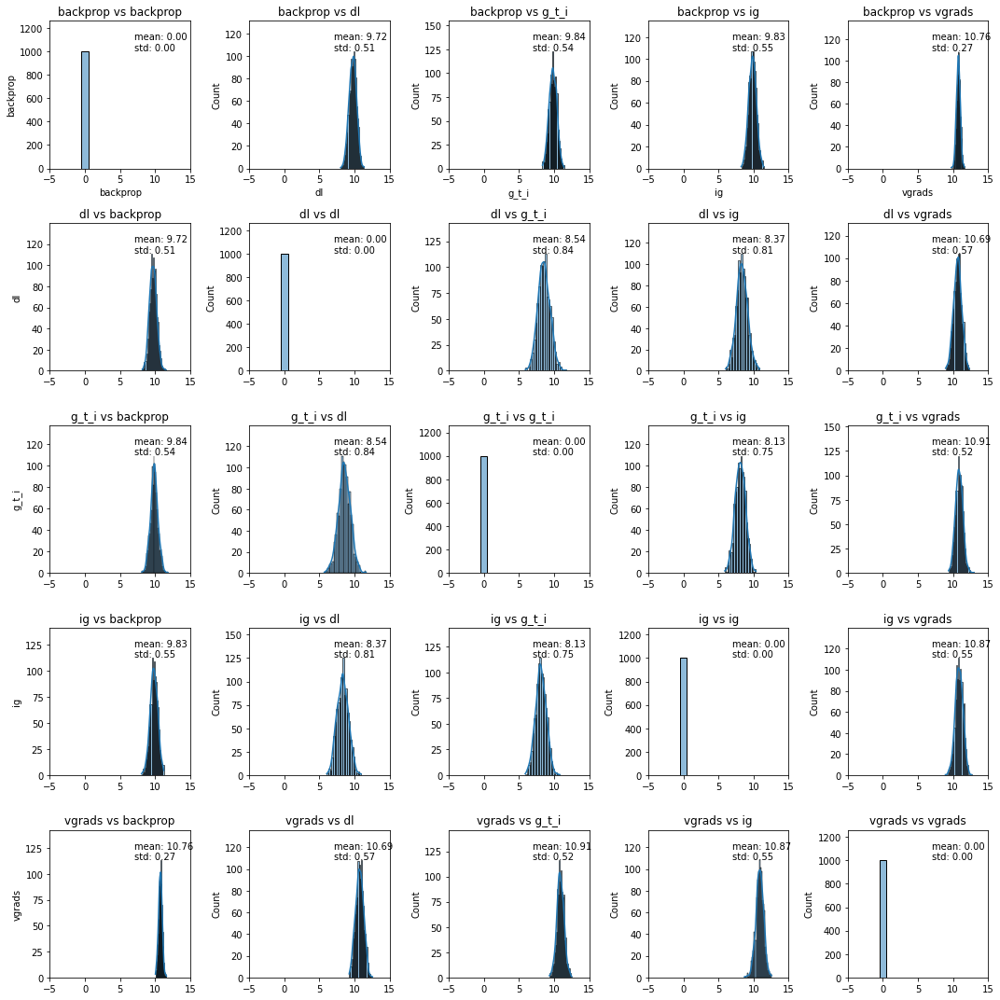

In [173]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_1), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_NoAttack_Mnist_cnn.png"

)

### RandLabels Attack

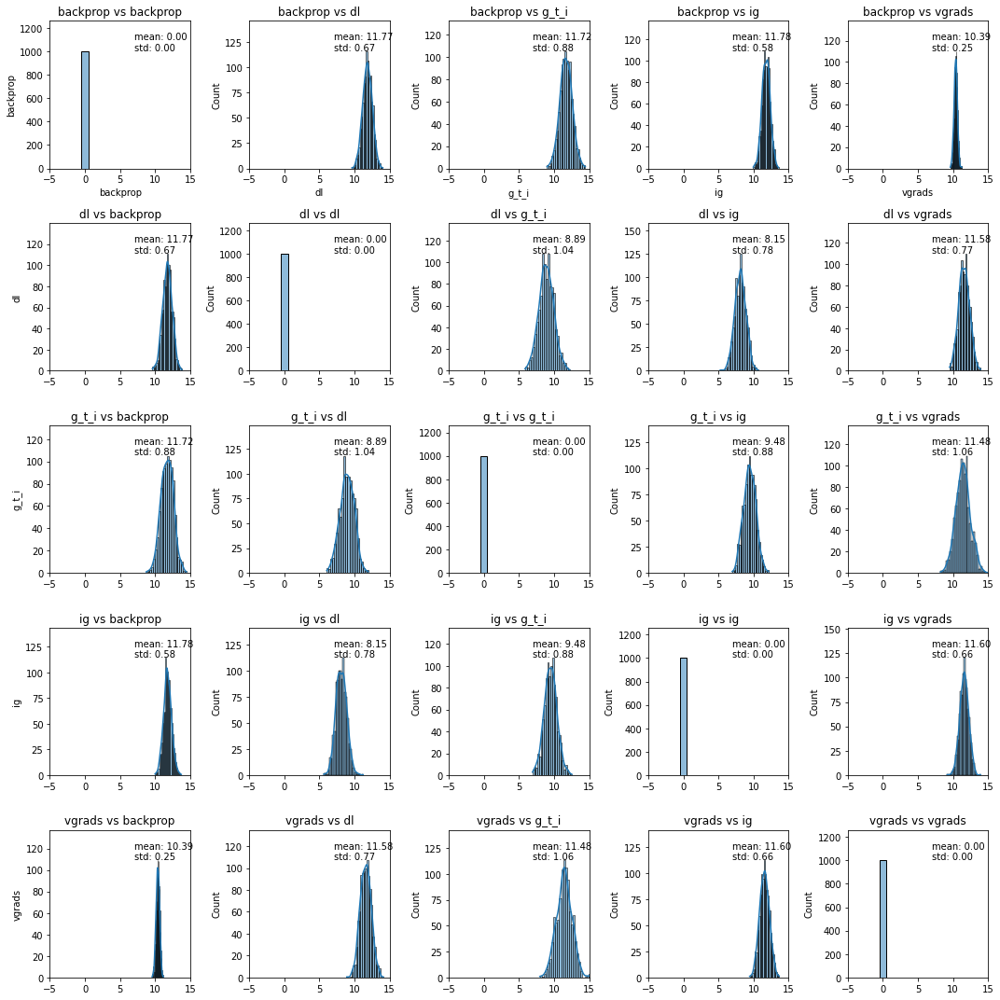

In [174]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_2), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandLabels_Mnist_cnn.png"
)

### RandParams Attack

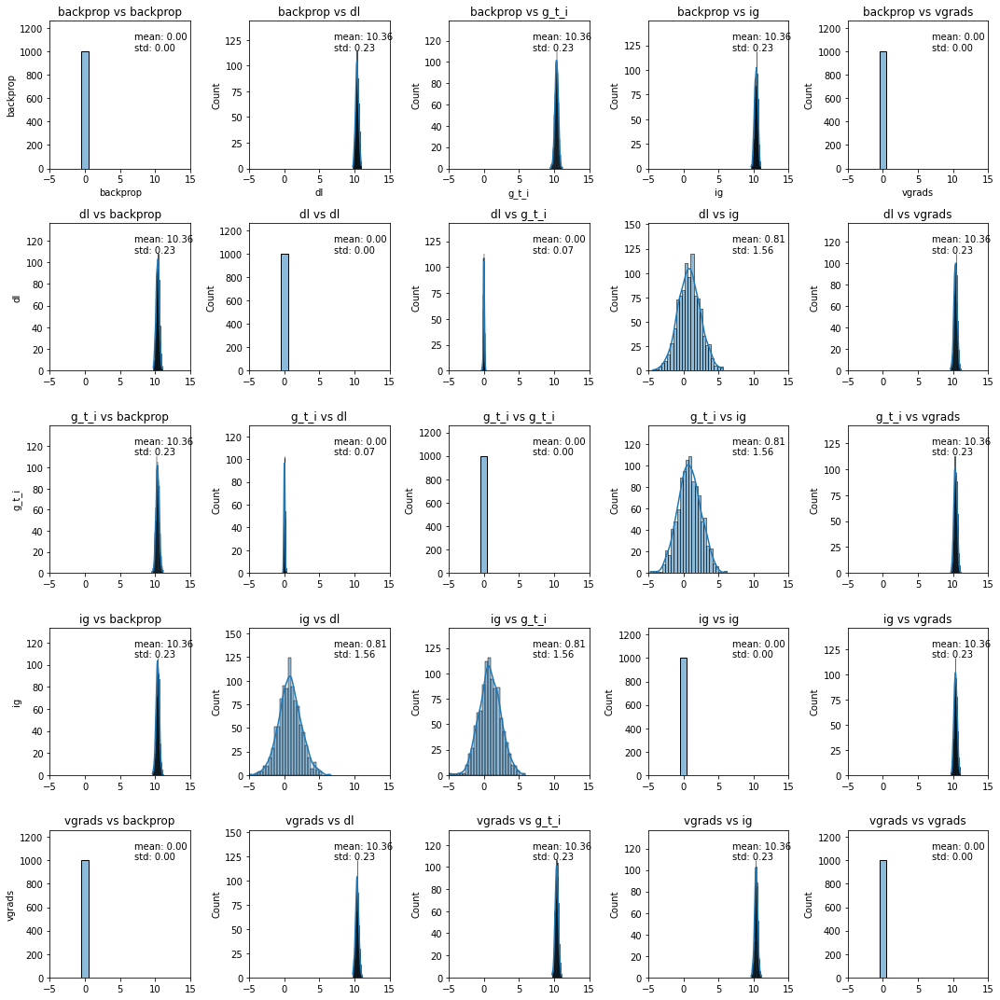

In [175]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_3), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandParams_Mnist_cnn.png"
)

### No Attack vs. RandLabels (Difference)

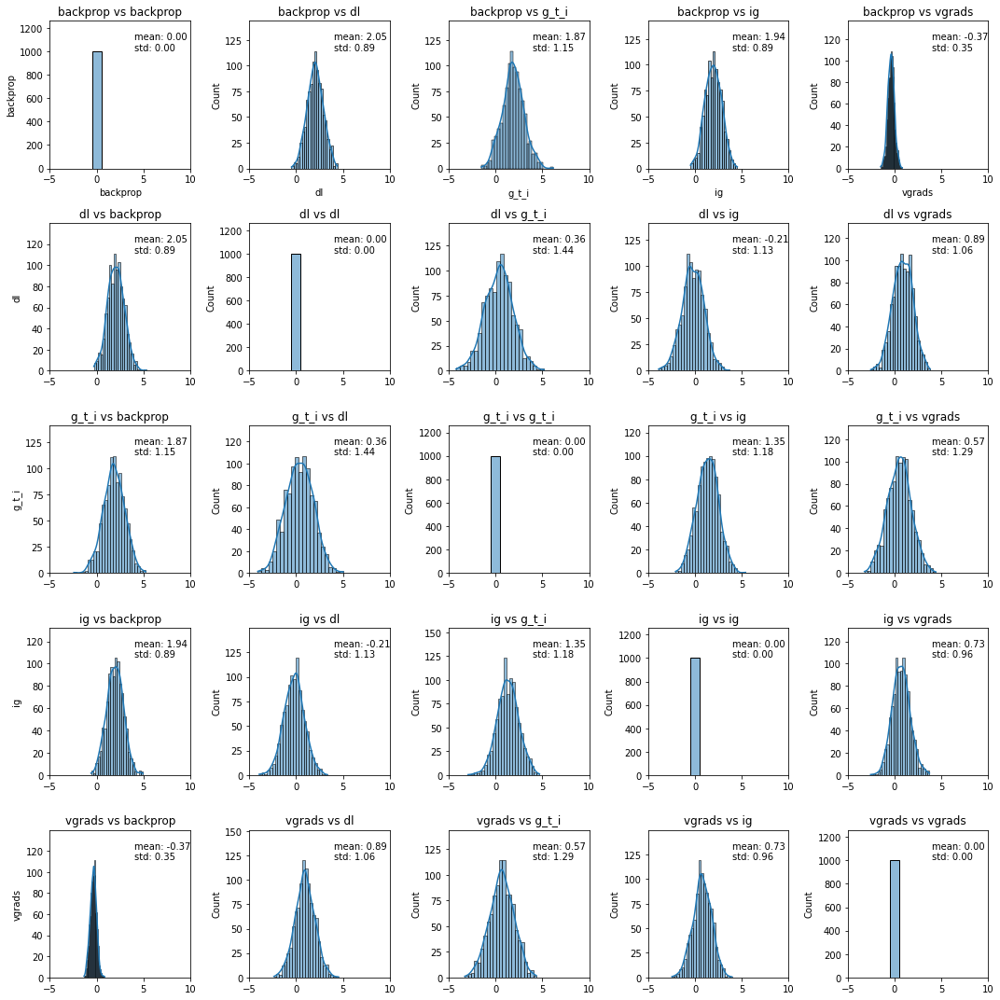

In [176]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 10),
    save_name="Distributions_NoAttack_RandLabels_Mnist_cnn_diff.png"
)

### No Attack vs. RandParams (Difference)

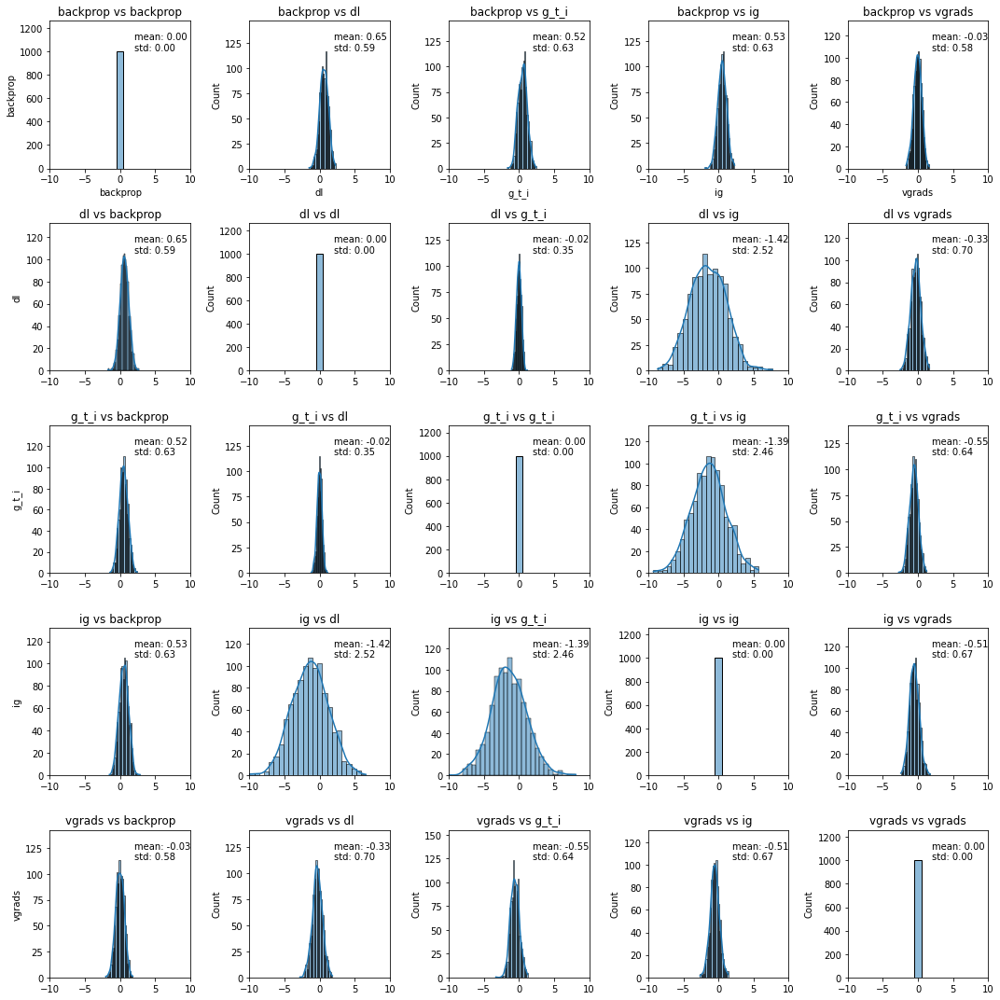

In [177]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-10, 10),
    save_name="Distributions_NoAttack_RandParams_Mnist_cnn_diff.png"
)

## UMap

### No Attack

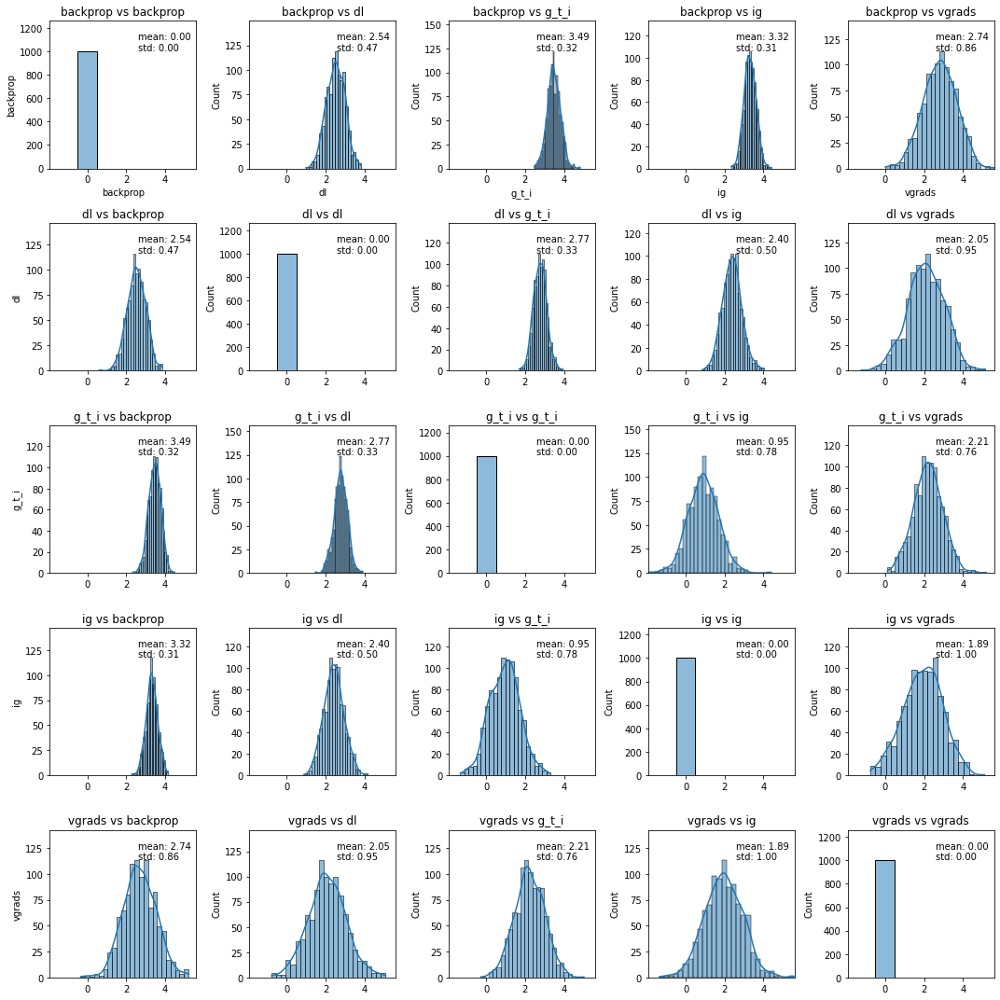

In [178]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

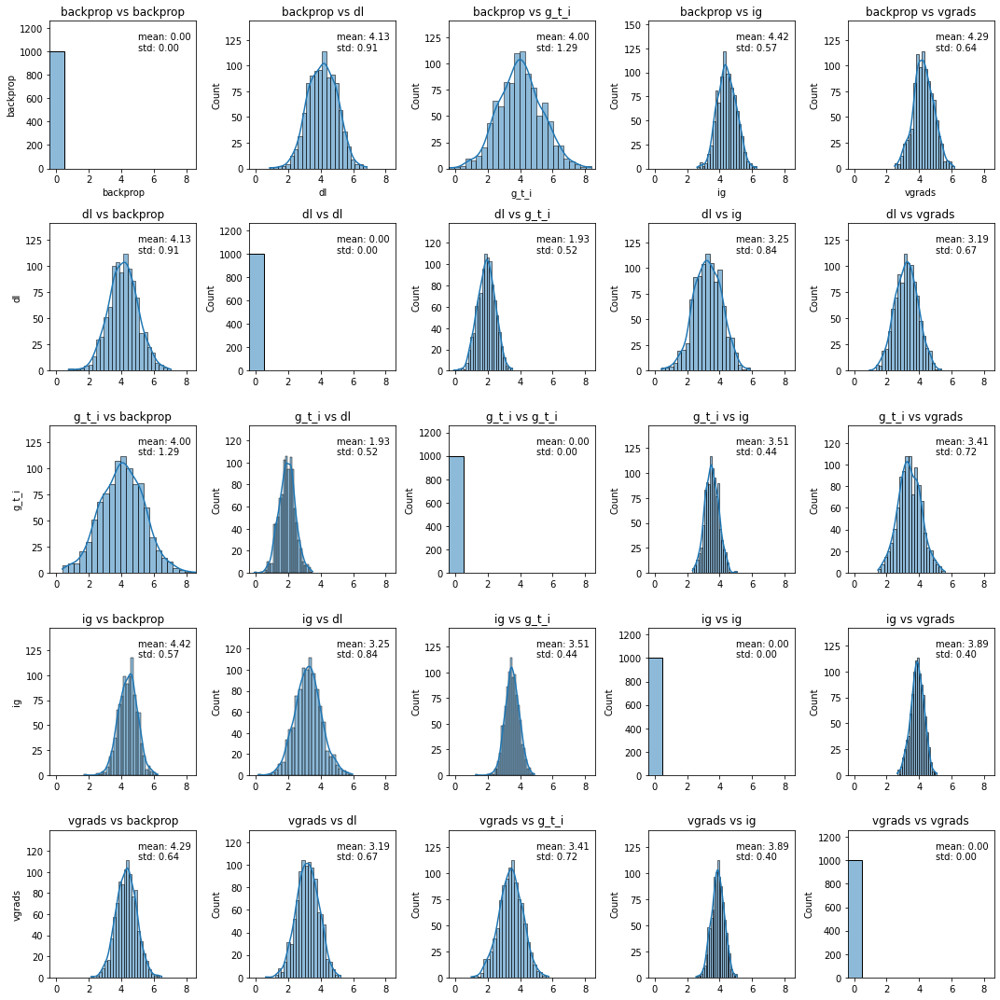

In [179]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

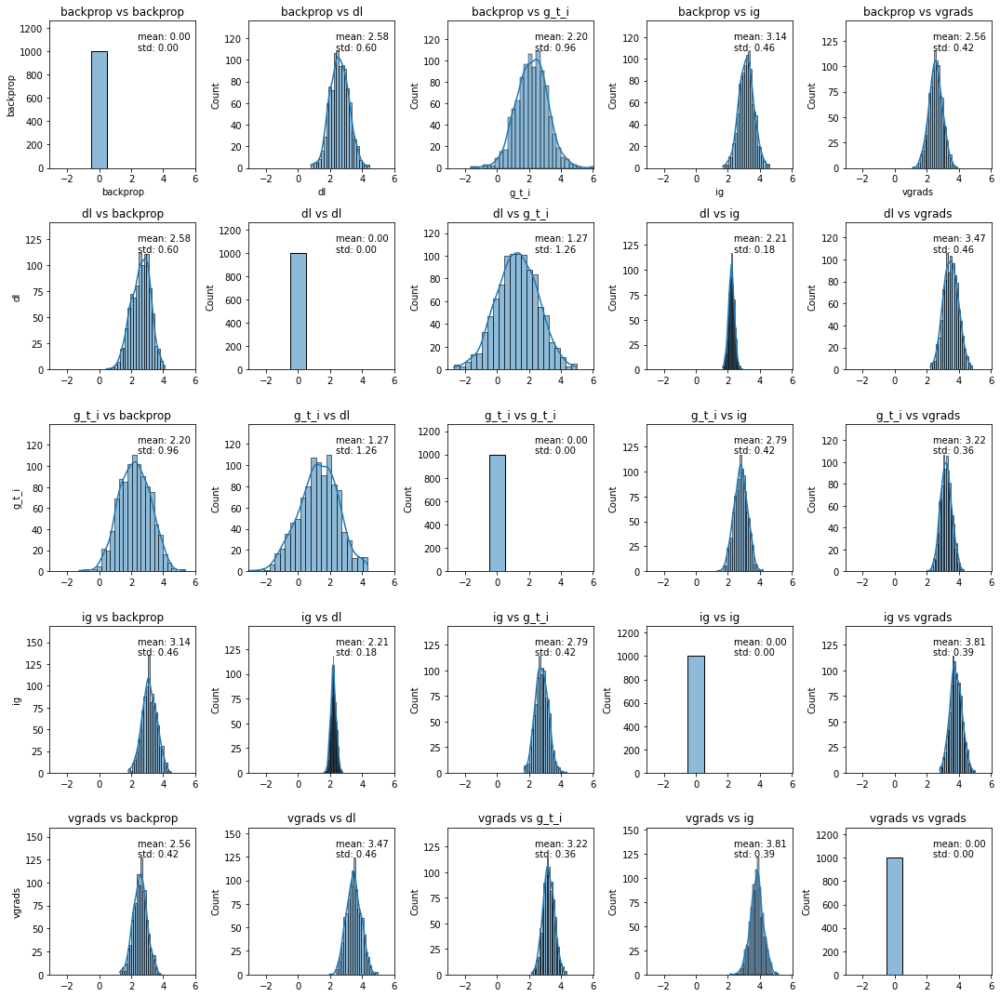

In [180]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

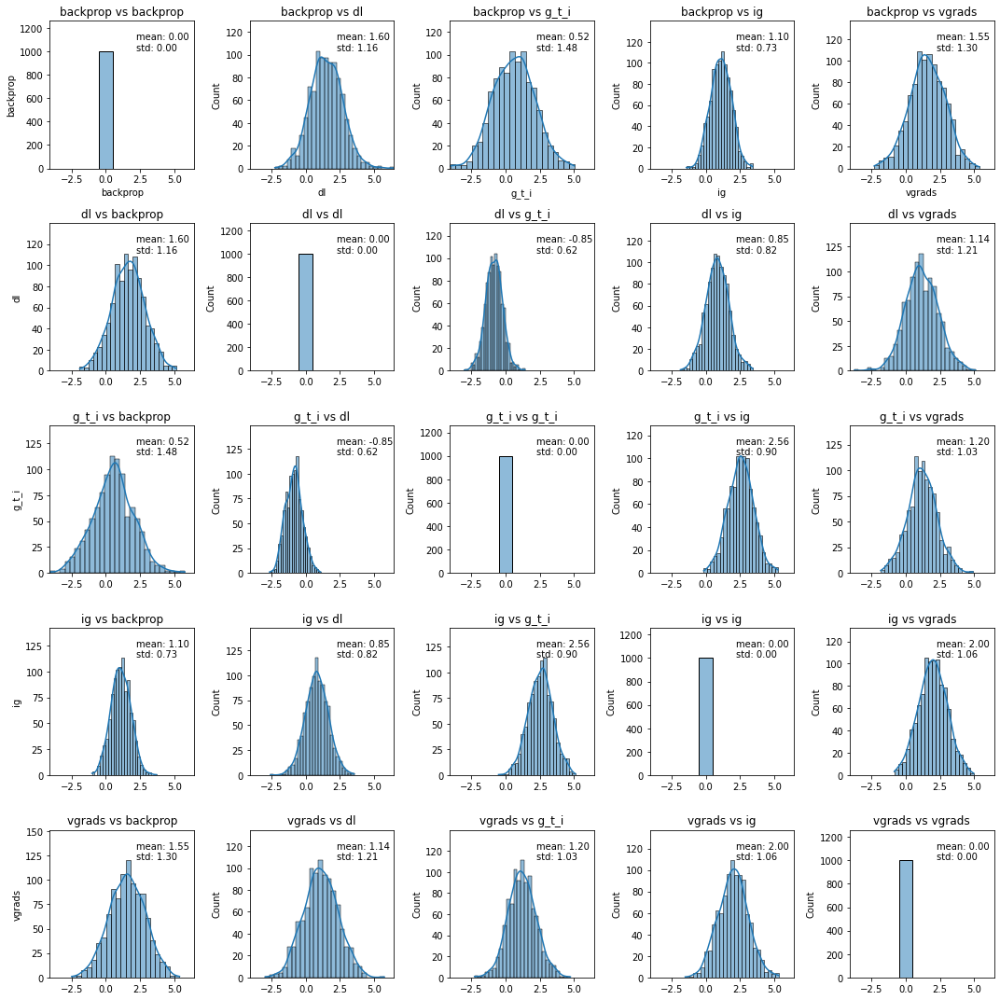

In [181]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

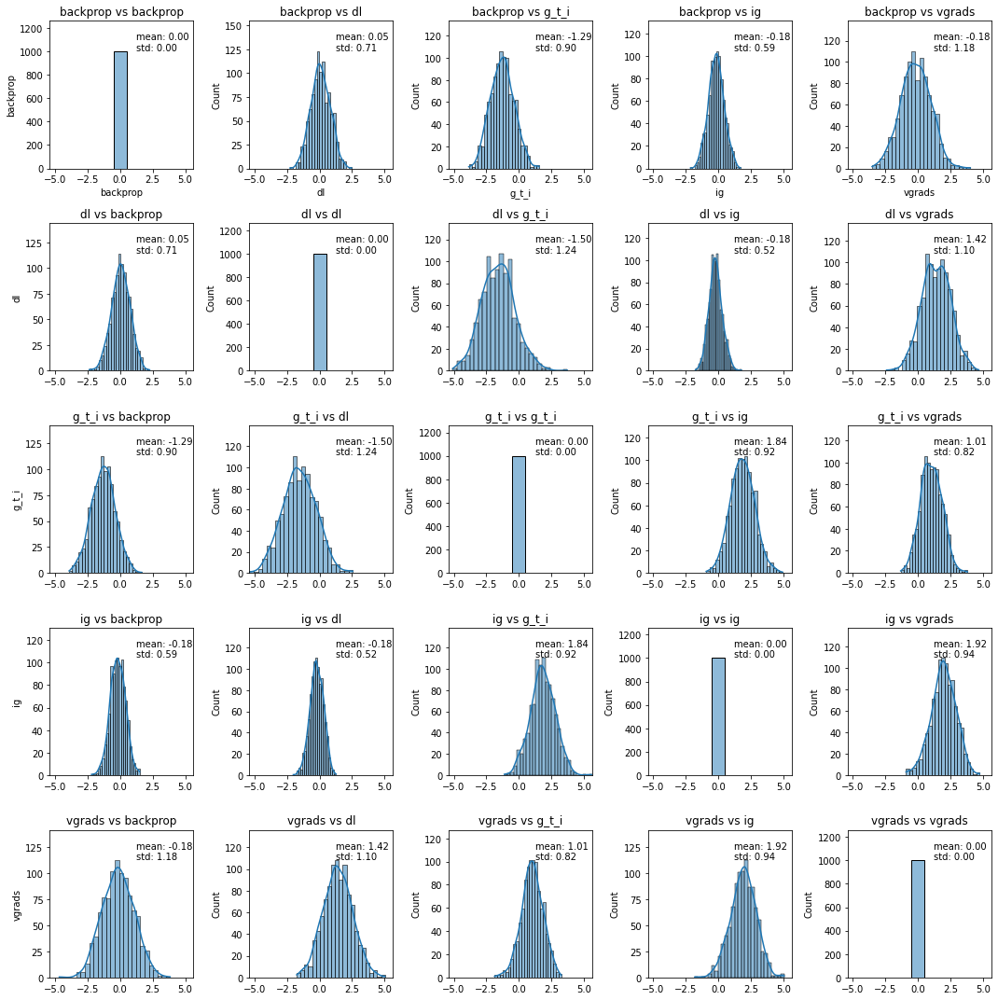

In [182]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (Linear)

### No Attack

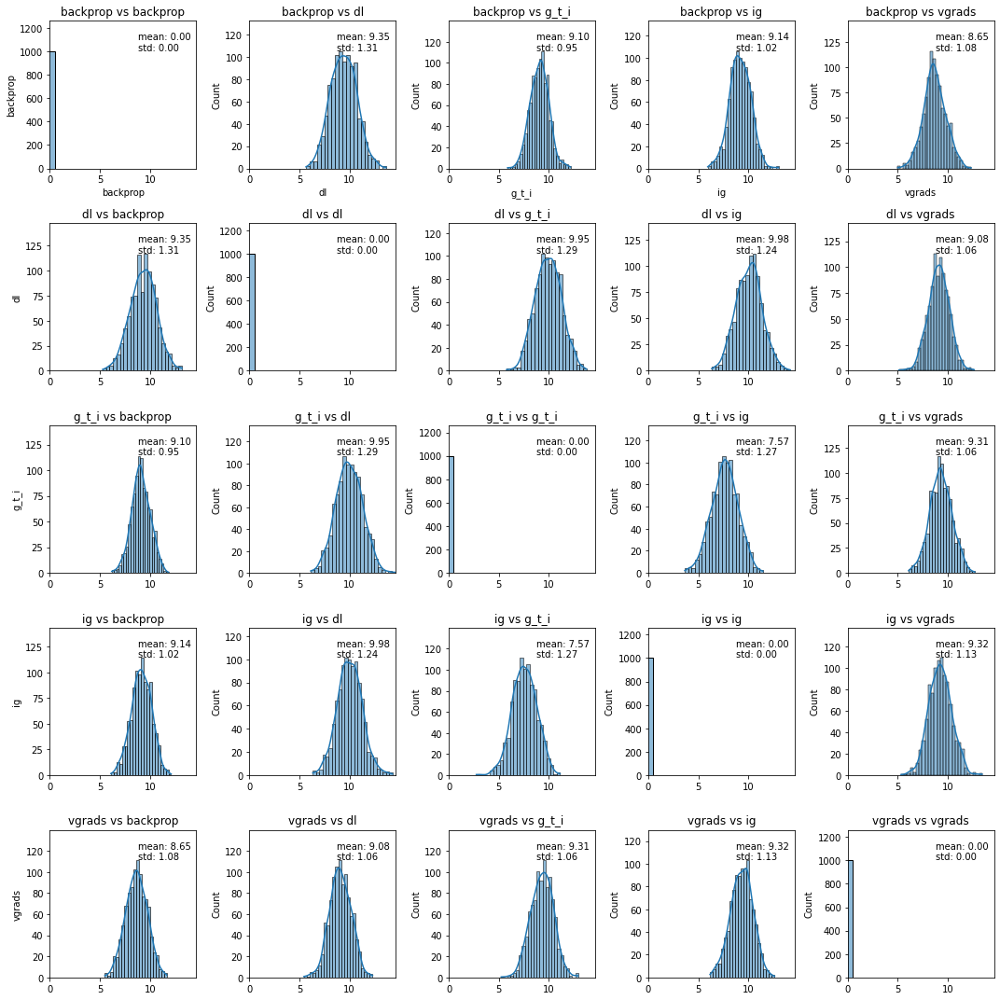

In [183]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

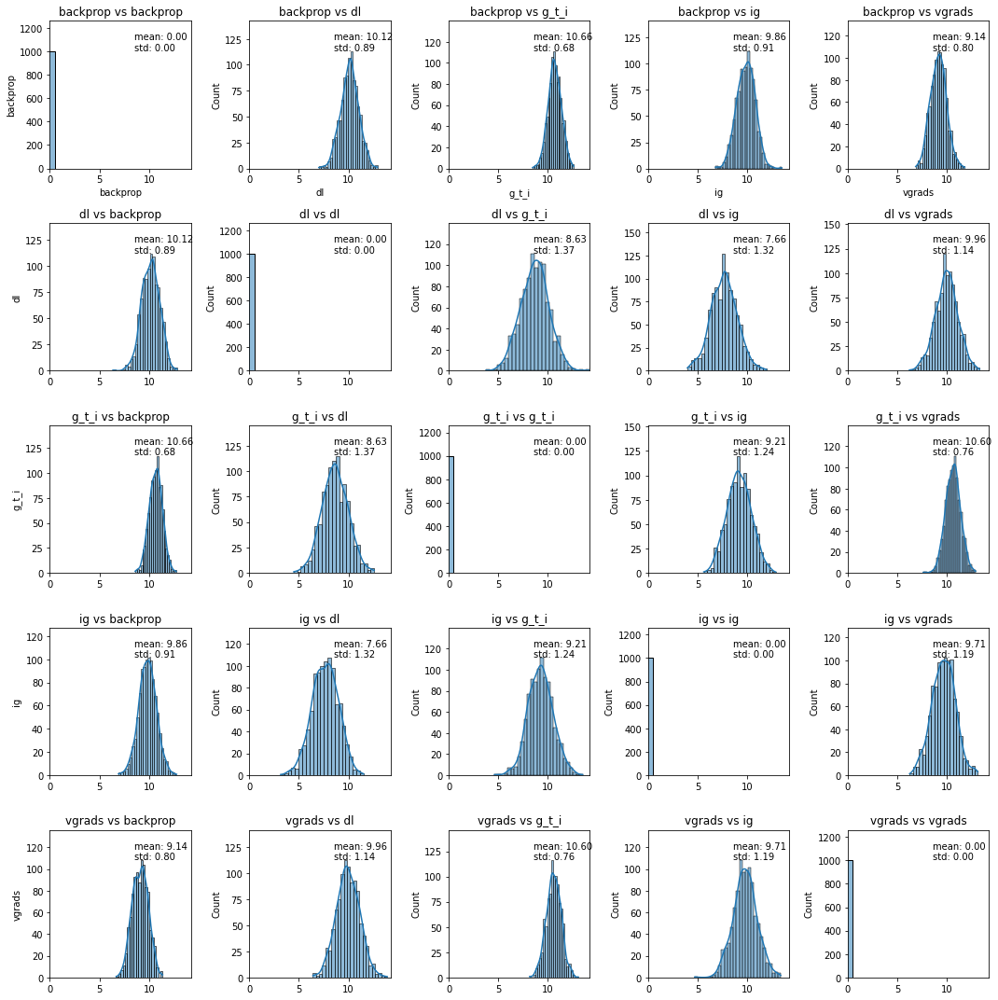

In [184]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

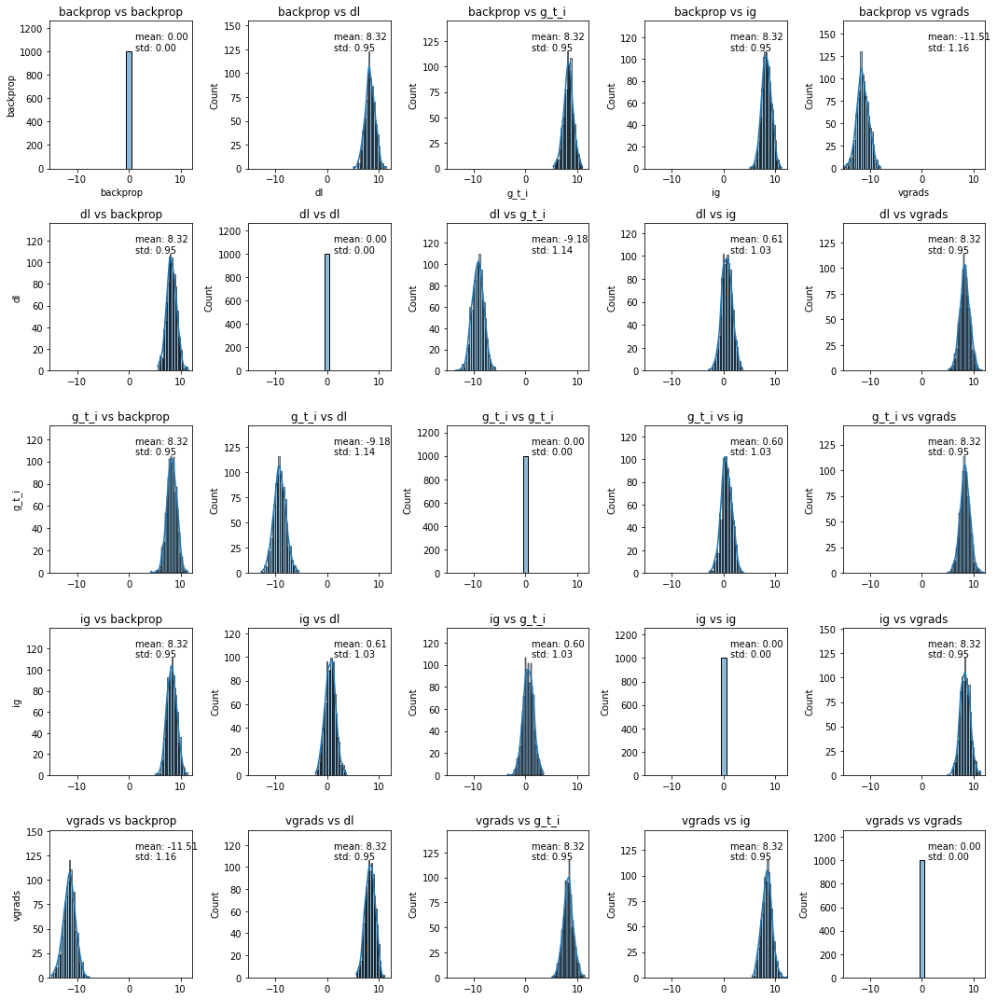

In [185]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

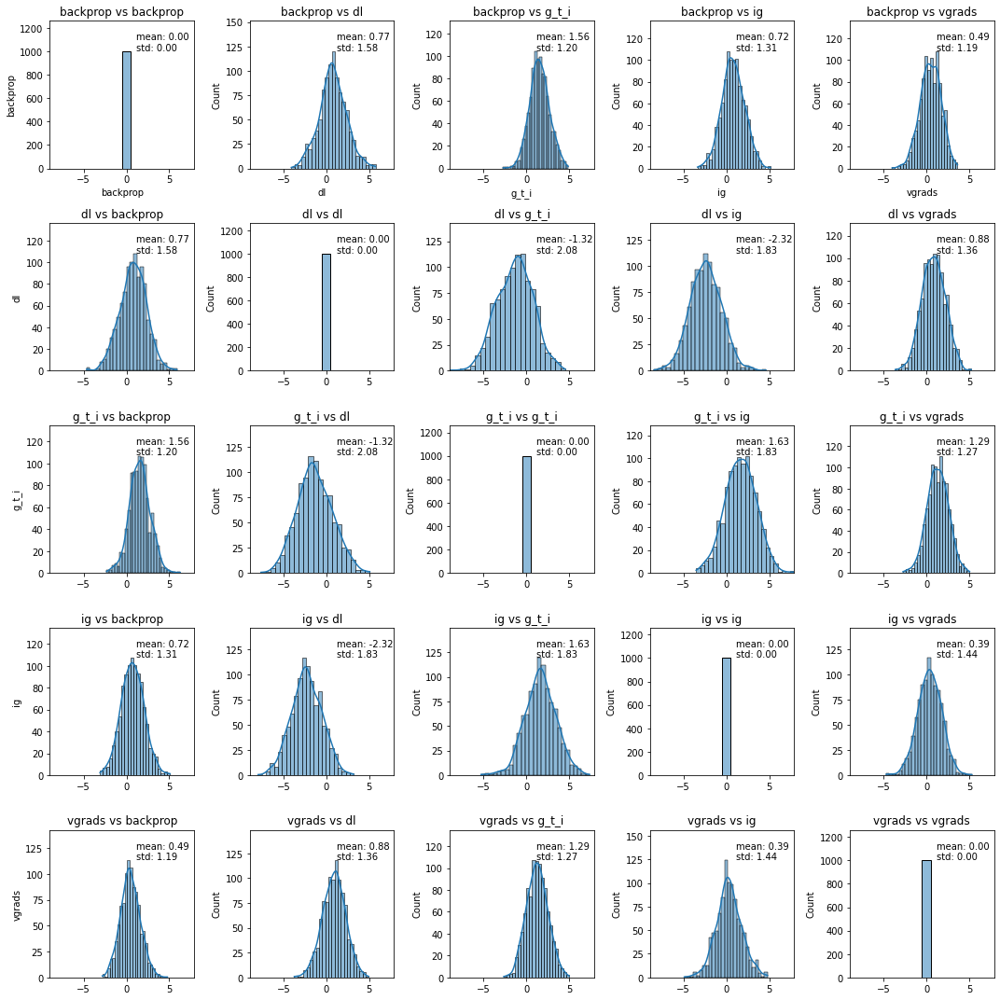

In [186]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

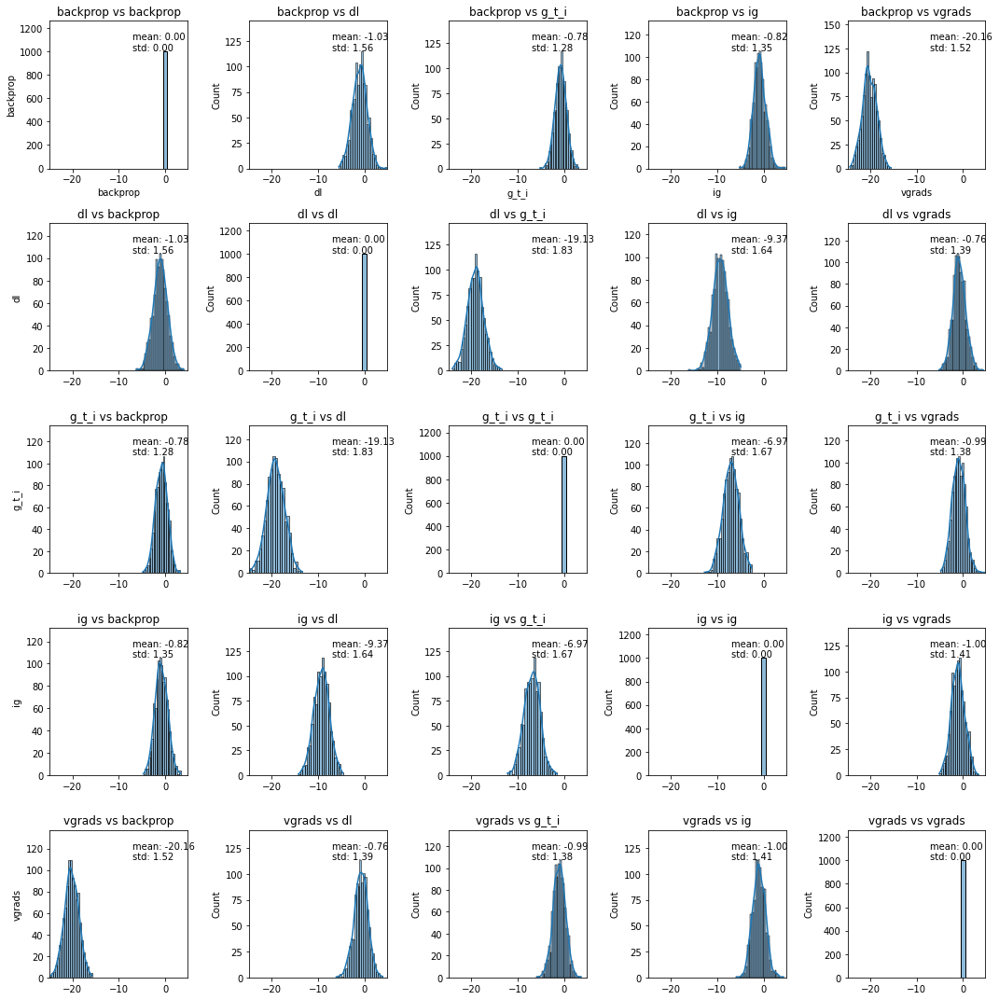

In [187]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (poly)

### No Attack

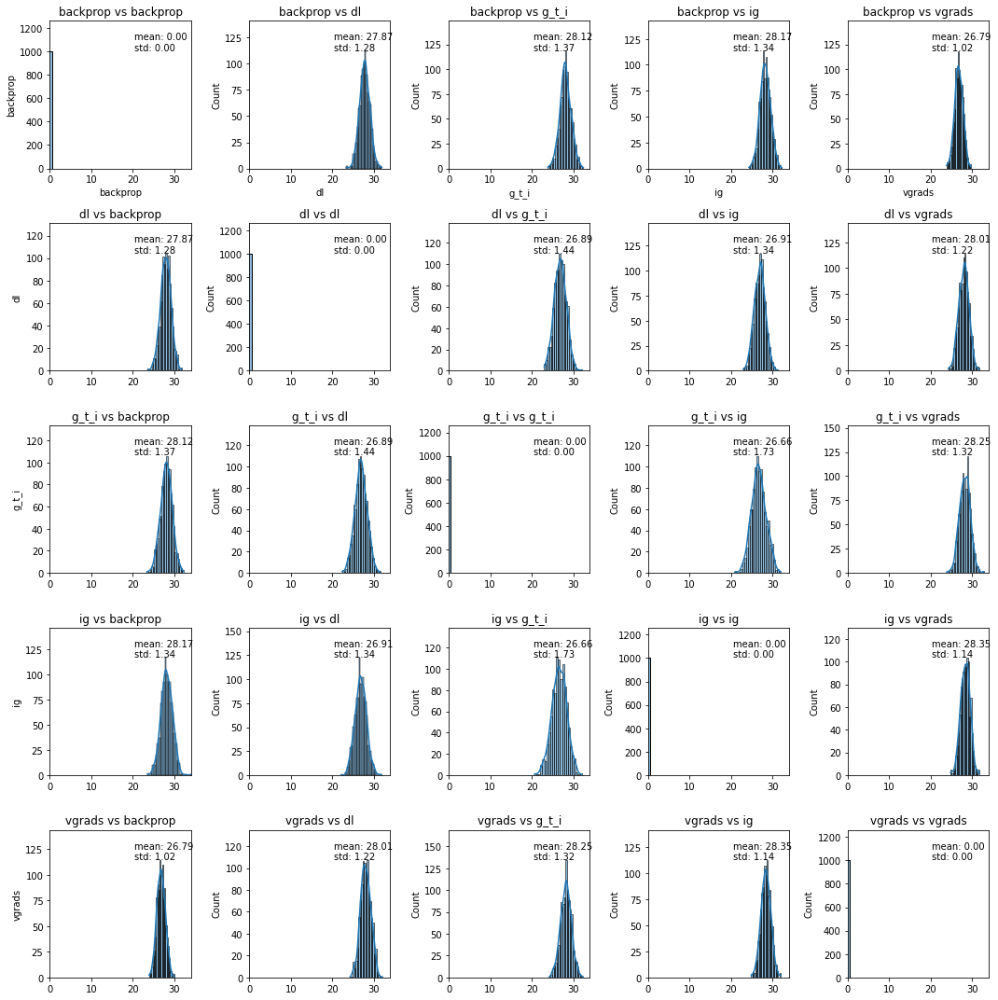

In [188]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

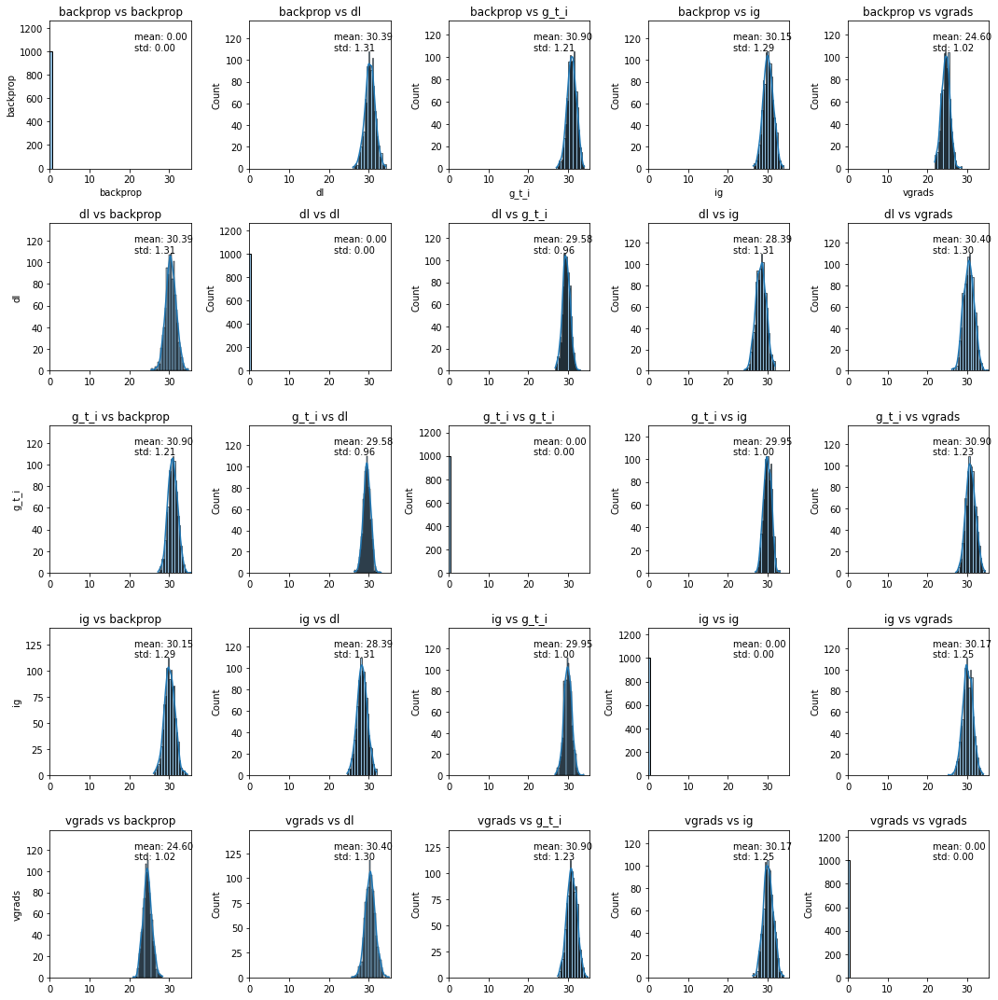

In [189]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

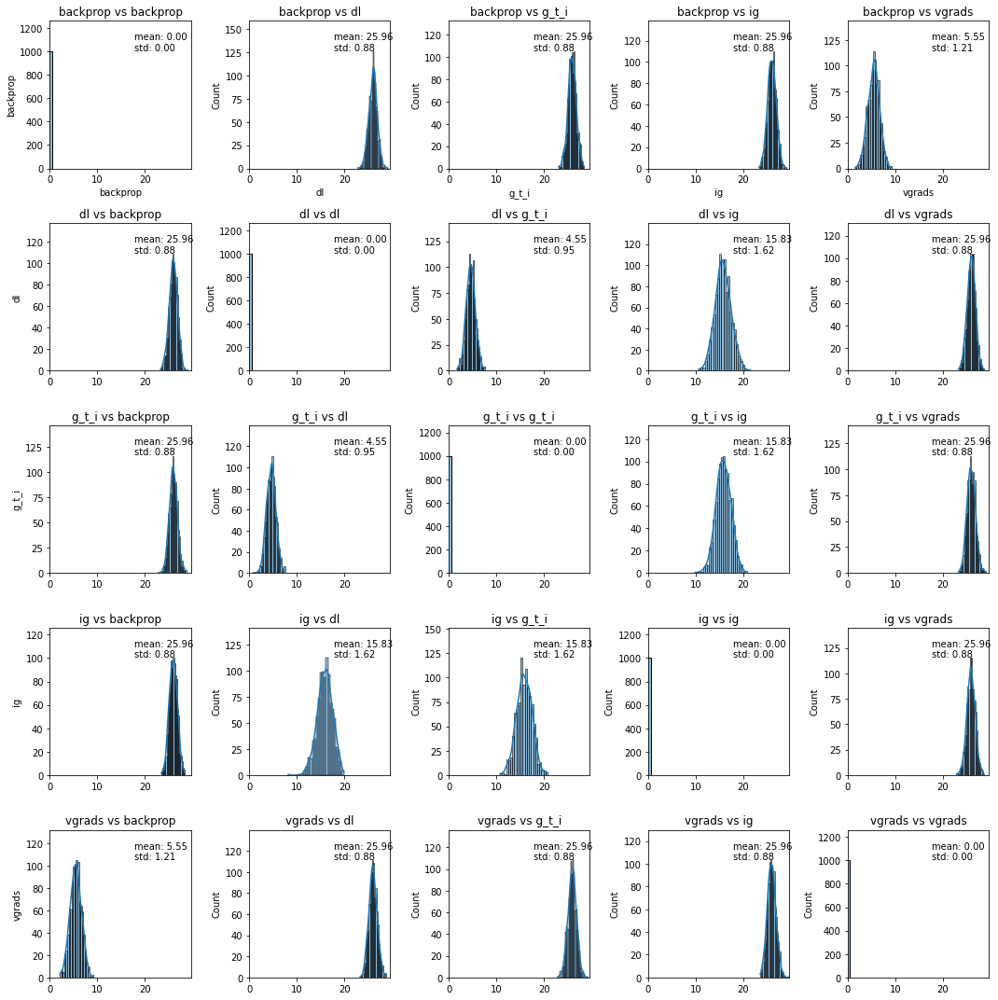

In [190]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

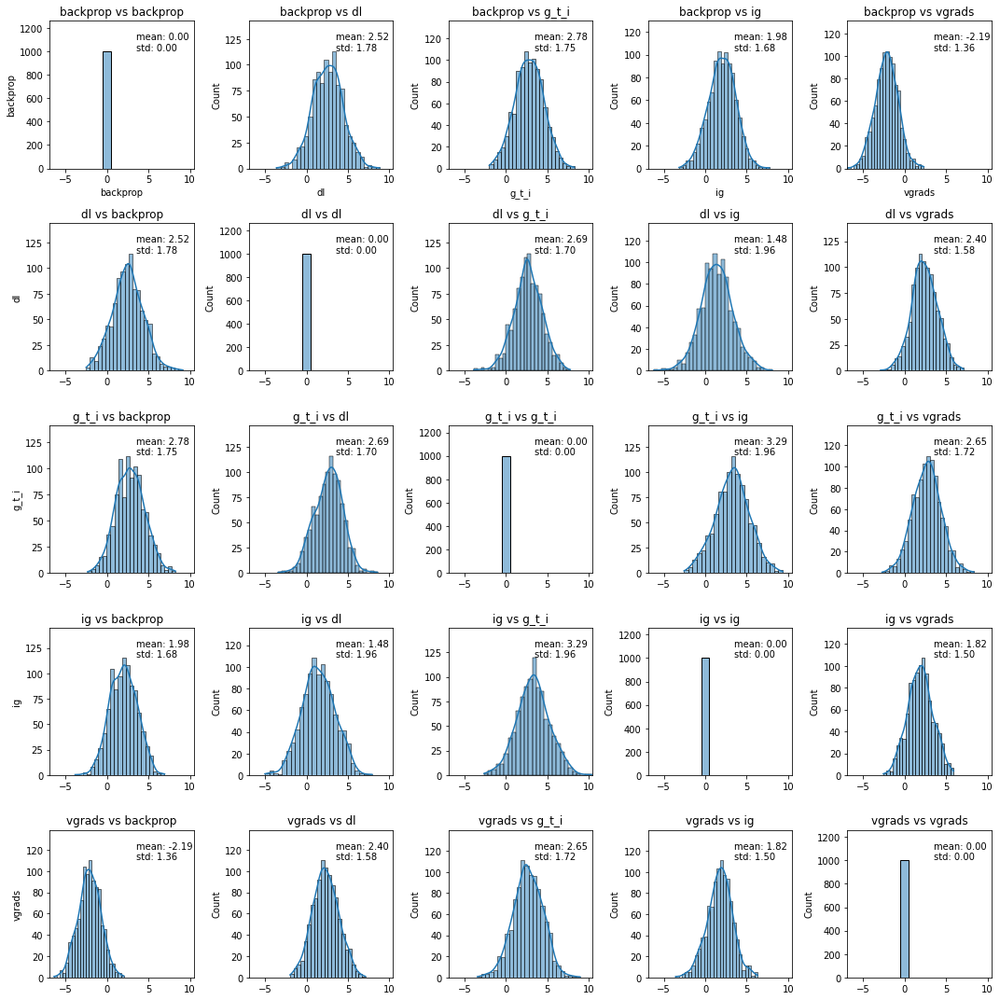

In [191]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

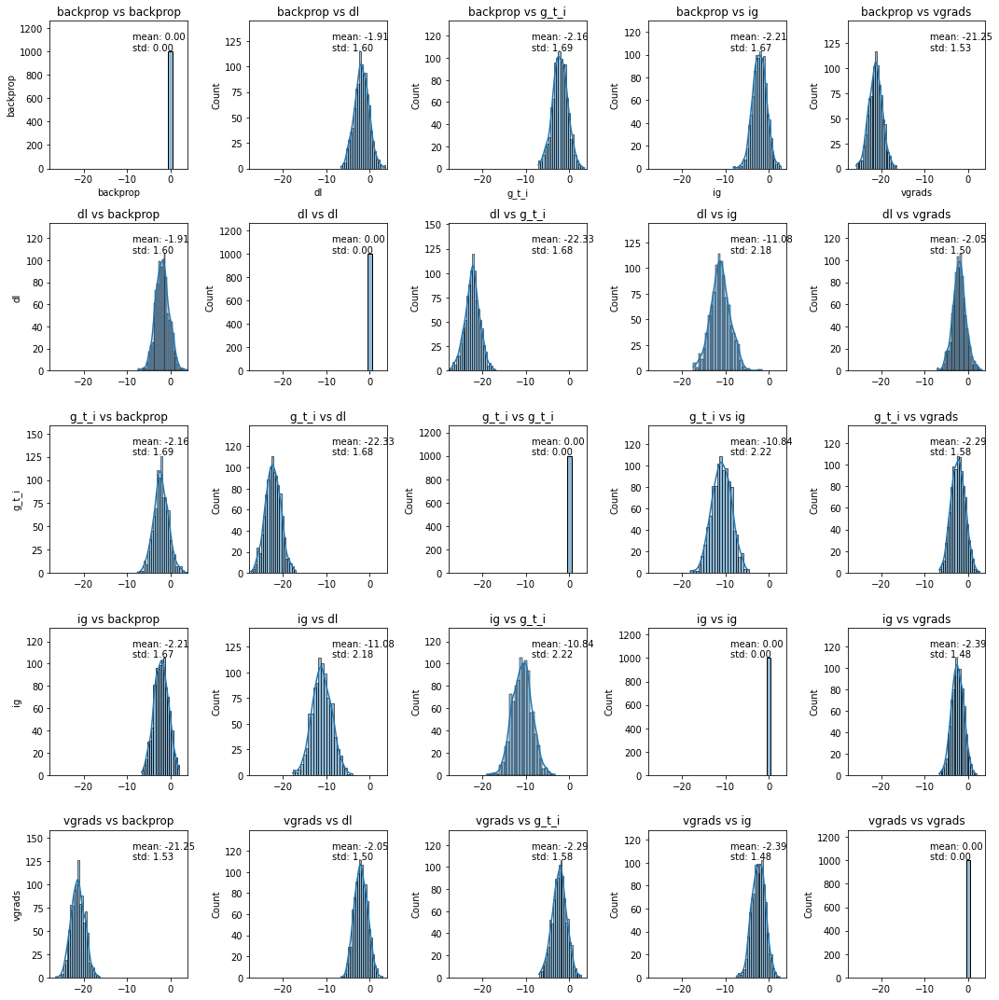

In [192]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (cosine)

### No Attack

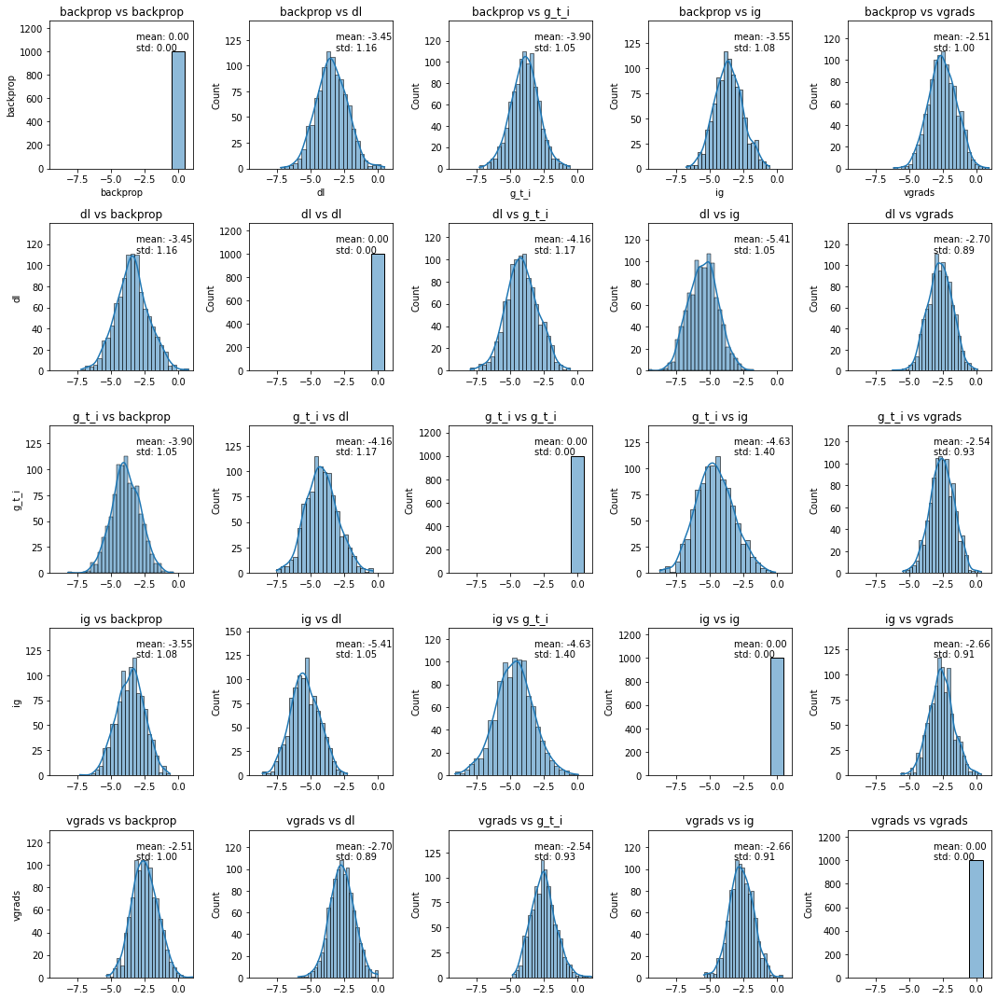

In [193]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

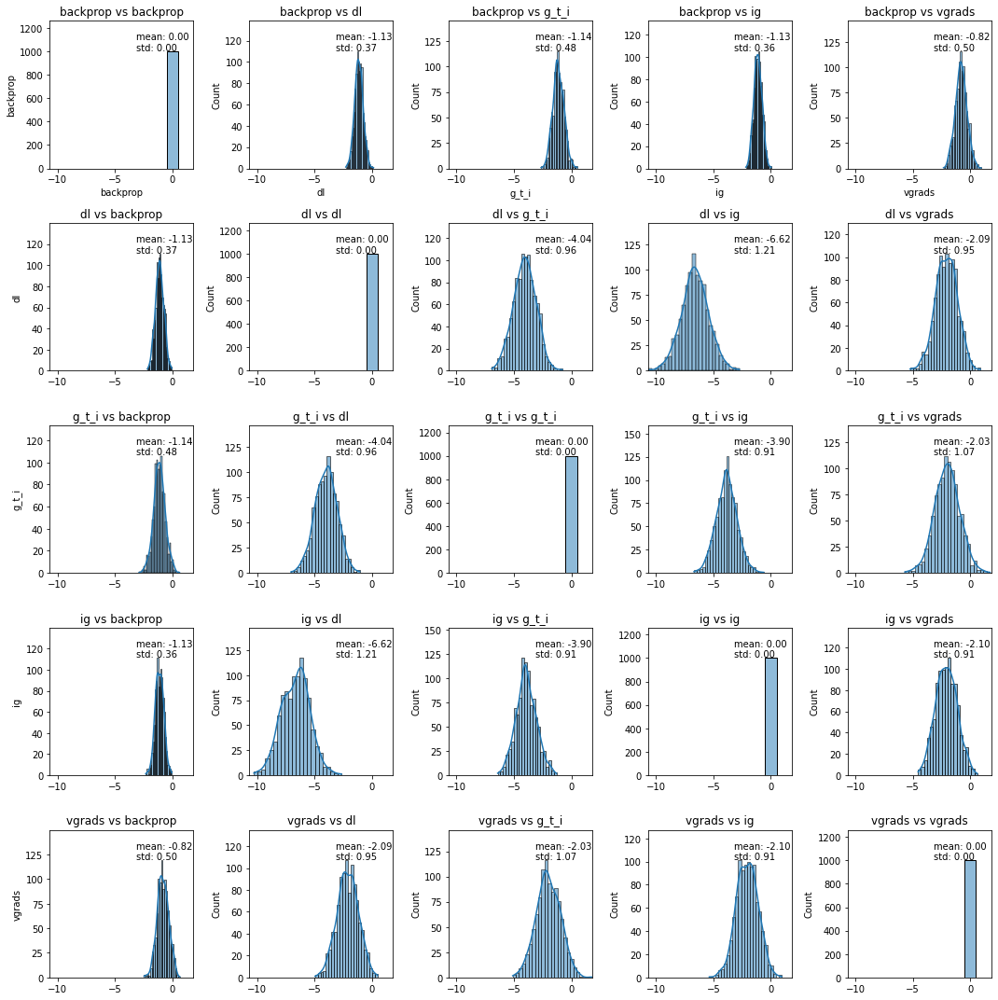

In [194]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

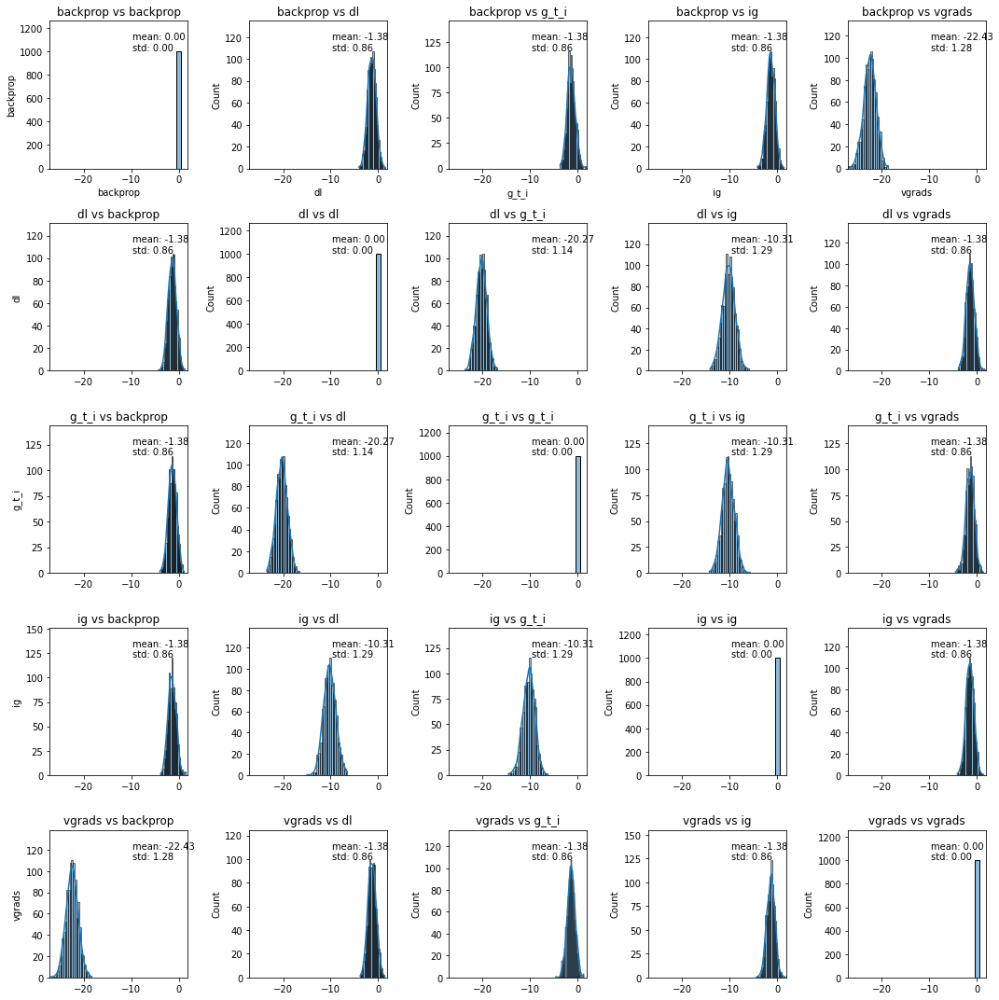

In [195]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

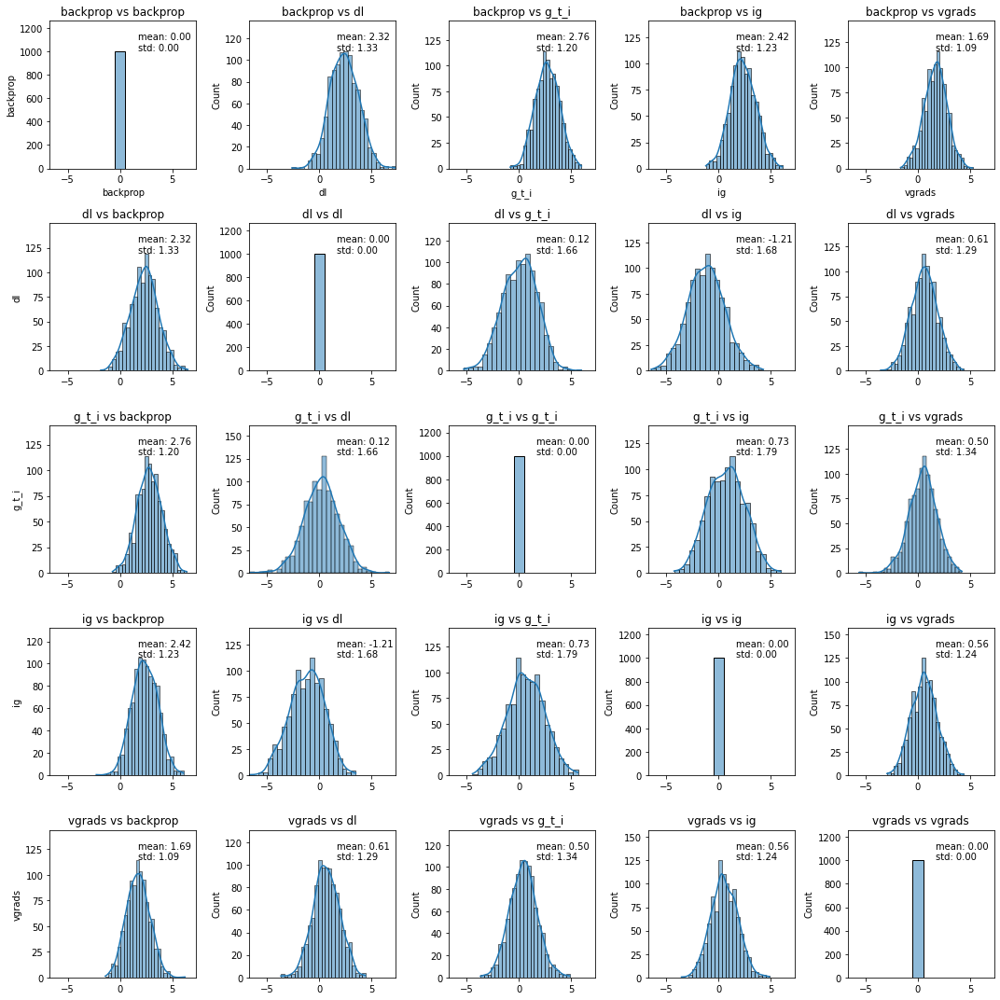

In [196]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

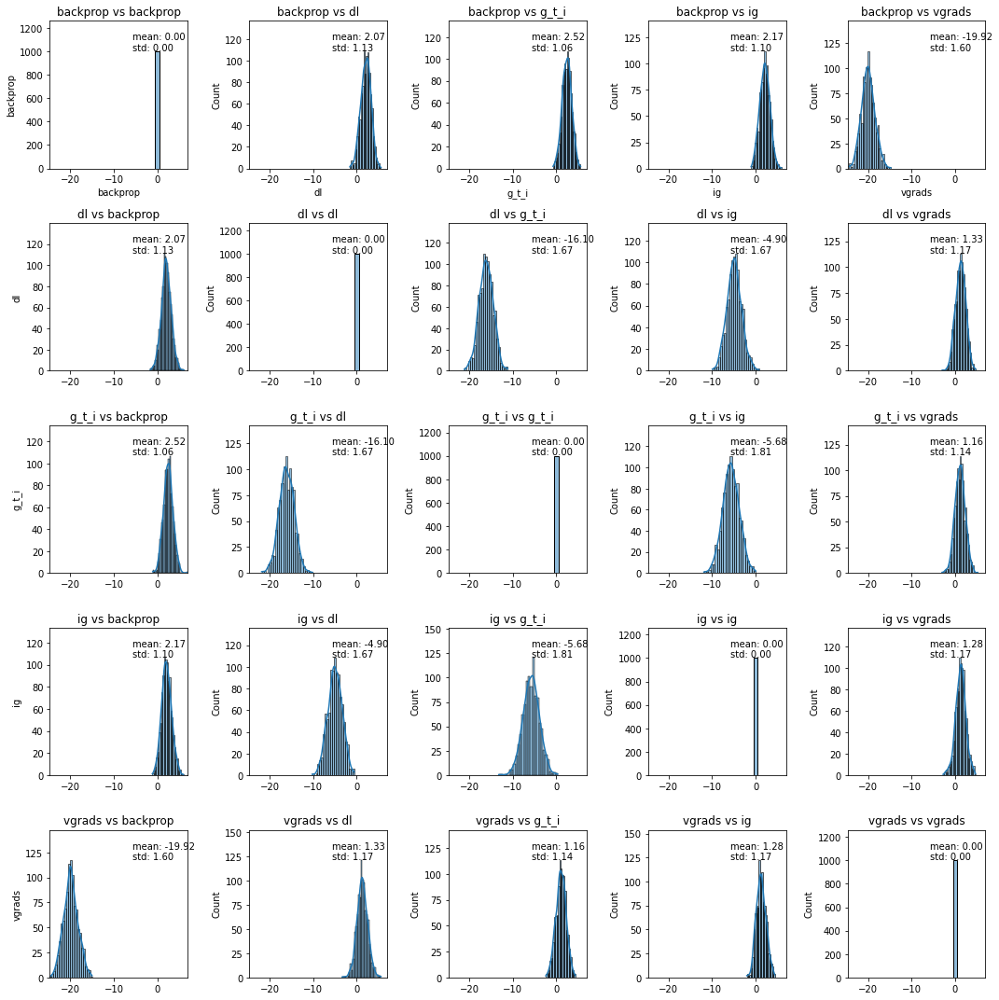

In [197]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## tSNE

### No Attack

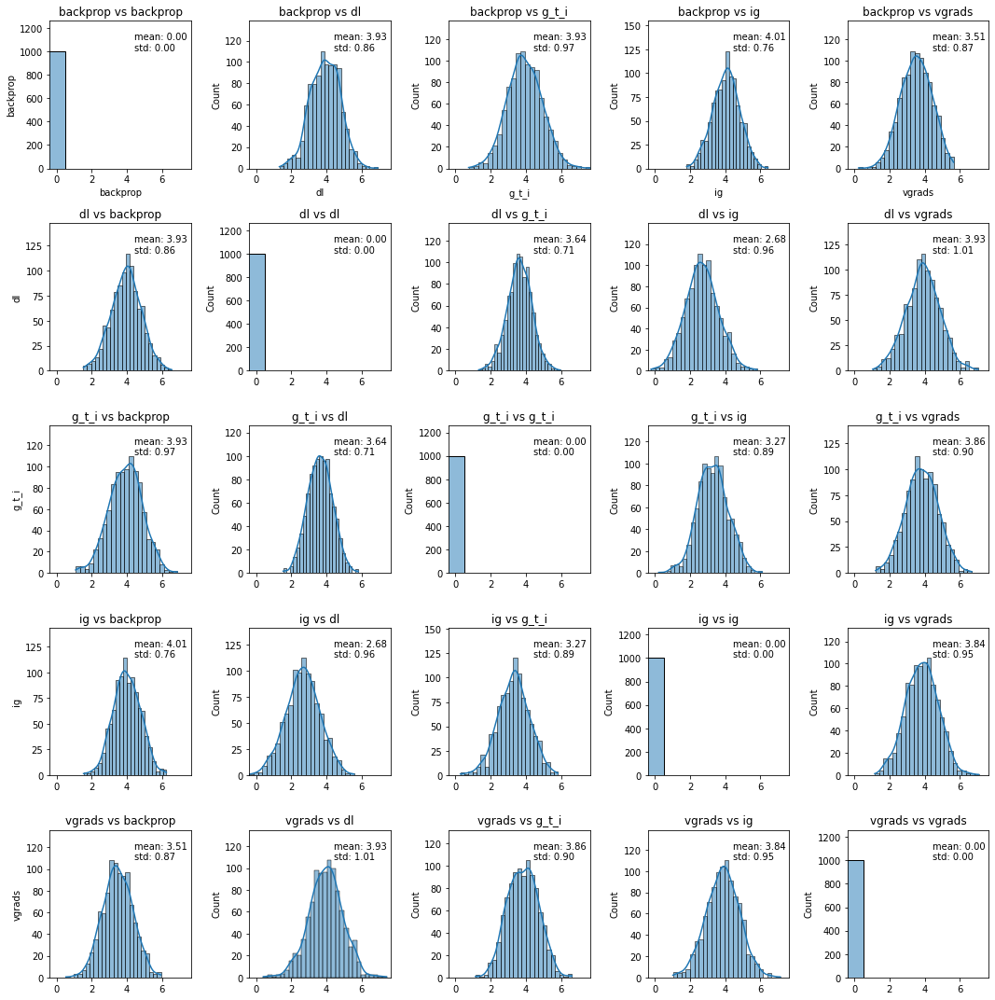

In [198]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

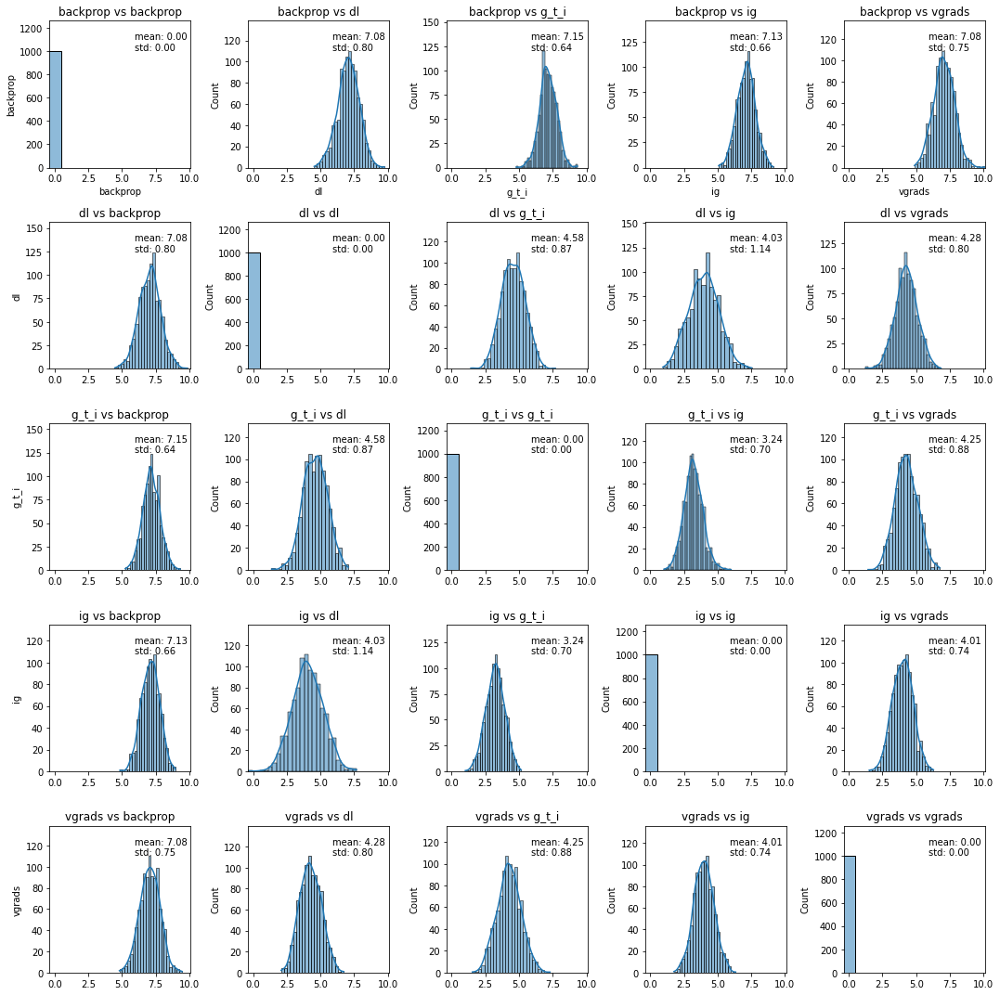

In [199]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

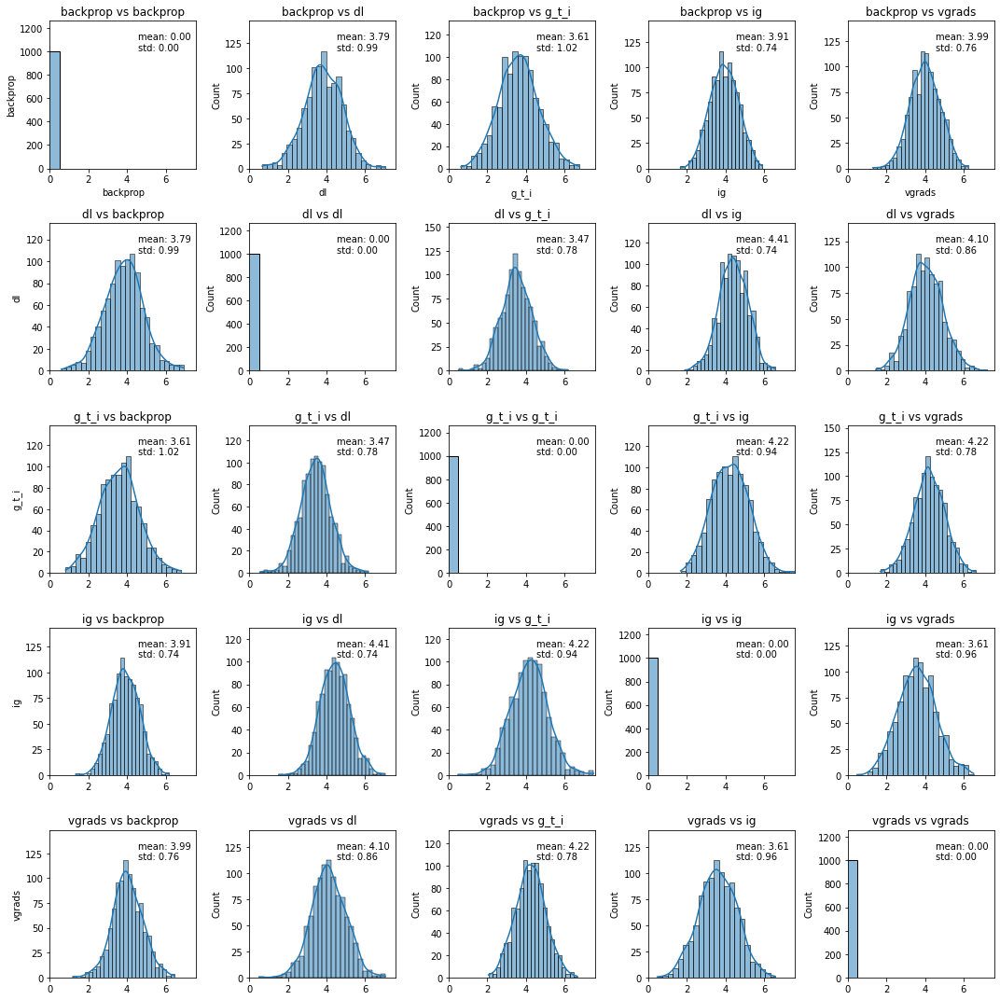

In [200]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

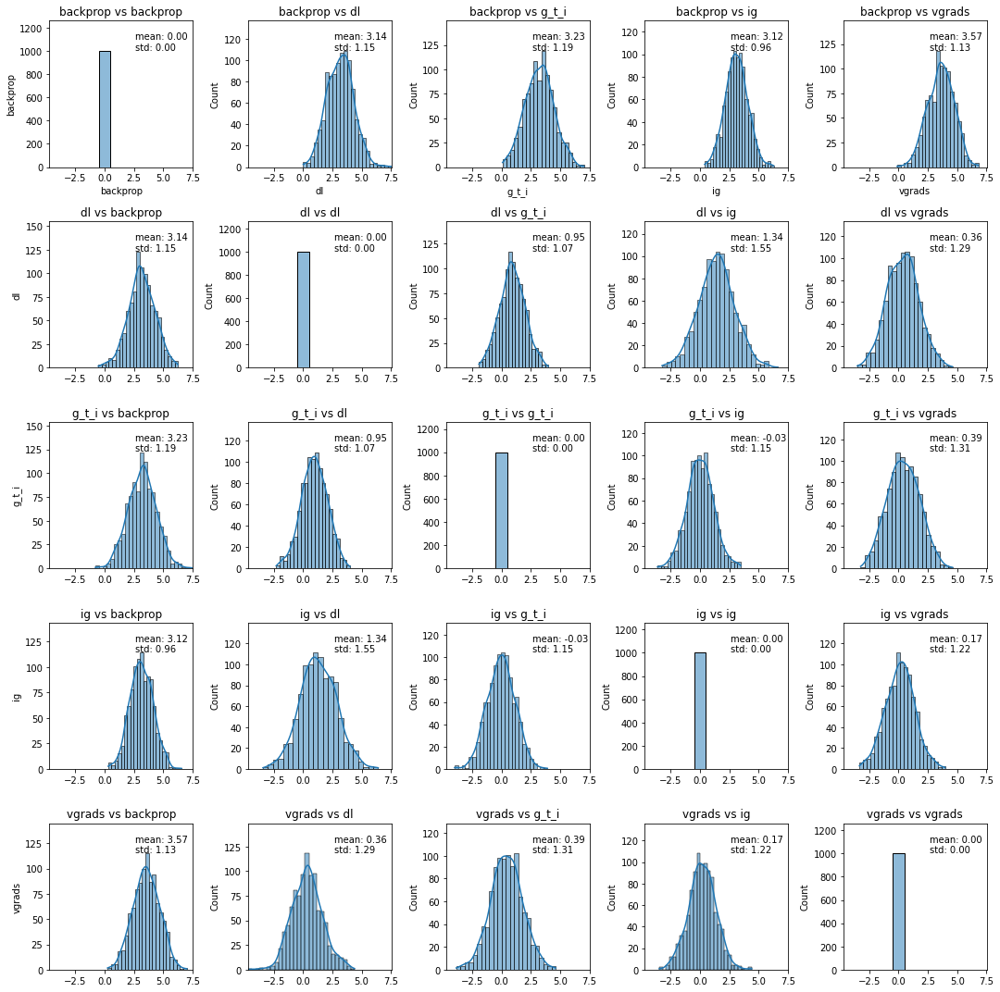

In [201]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

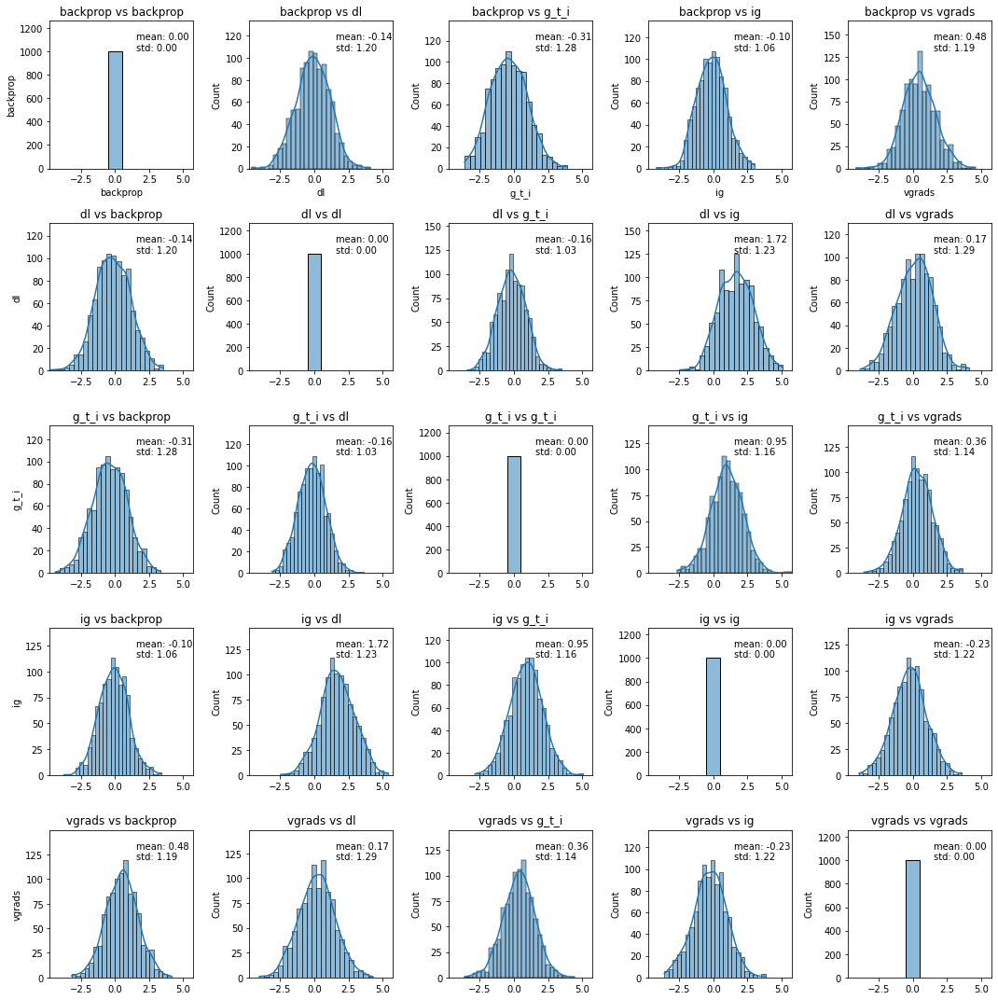

In [202]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)